## All data

In [2]:
import json
import glob
import os
import pandas as pd

# ==========================================
# 1. CONFIGURATION
# ==========================================

LOG_DIRECTORIES = "/lustre/groups/eml/projects/huang/multi_image/lmms-eval/logs/qwen2_5_vl-mask-attention"
# ==========================================
# 2. DATA EXTRACTION
# ==========================================

def get_primary_score(metrics):
    """Finds the first float value that isn't stderr/alias."""
    for key, val in metrics.items():
        if isinstance(val, (int, float)) and "stderr" not in key and "alias" not in key:
            return val * 100
    return None

all_rows = []

# Iterate through directories
# Find all JSON results recursively
search_pattern = os.path.join(LOG_DIRECTORIES, "**", "*_results.json")
files = glob.glob(search_pattern, recursive=True)

for file_path in files:
    try:
        with open(file_path, 'r') as f:
            data = json.load(f)
    except:
        continue

    # 1. Identify Model
    model_name = data.get('model_name_sanitized', data.get('model_name', 'Unknown'))
    model_name = model_name.split("__")[1]
    # The layer is the part after -mask-attention- 
    layer = file_path.split("/")[-3].split("-mask-attention-")[-1]
    row = {
        'Model': model_name,
        'Masked Layers': layer
    }

    # 2. Extract Scores
    results = data.get('results', {})
    
    for task, metrics in results.items():
        score = get_primary_score(metrics)
        
        if score is None: continue

        # Map to readable column names
        if task == 'blink':
            row['BLINK'] = score
        elif task == 'mirb':
            row['MIRB'] = score
        elif task == 'muirbench':
            row['MuirBench'] = score
        elif task.startswith('blink_'):
            # Clean subtask name: blink_art_style -> Art Style
            clean_name = task.replace('blink_', '').replace('_', ' ').title()
            row[clean_name] = score
    
    if len(row) > 2: # Only add if we found some metrics
        all_rows.append(row)

# ==========================================
# 3. DATAFRAME CREATION
# ==========================================

if all_rows:
    df = pd.DataFrame(all_rows)
    
    # Sort by Model first (versions together), then Experiment
    df = df.sort_values(by=['Model', 'Masked Layers']).reset_index(drop=True)
    # Reorder the DataFrame so that 'Baseline' and 'all' rows come first,
    # followed by individual mask layers (single numbers), then grouped ranges.

    # Helper function to create a sorting key for 'Masked Layers'
    import re

    def masked_layer_sort_key(x):
        # Put 'baseline' and 'all' at the very top
        x_lower = str(x).lower()
        if x_lower == 'baseline' or x_lower == 'all':
            return (0, 0, 0)
        # Individual layer: just a single integer (e.g. '0', '5')
        if re.fullmatch(r'\d+', str(x)):
            return (1, int(x), 0)
        # Grouped range: e.g. '0-3', '4-7'
        m = re.fullmatch(r'(\d+)\-(\d+)', str(x))
        if m:
            return (2, int(m.group(1)), int(m.group(2)))
        # Other: put at end
        return (3, 0, 0)

    df = df.copy()
    df['__ml_sortkey'] = df['Masked Layers'].map(masked_layer_sort_key)
    df = df.sort_values(by=['Model', '__ml_sortkey']).reset_index(drop=True)
    df = df.drop(columns="__ml_sortkey")
    
    
    

    # --- TABLE 1: MAIN BENCHMARKS ---
    main_benchmarks = ['BLINK', 'MIRB', 'MuirBench']
    
    # Filter columns that actually exist in the data
    valid_main_cols = [c for c in main_benchmarks if c in df.columns]
    
    if valid_main_cols:
        # Create Main DataFrame
        df_main = df[['Model', 'Masked Layers'] + valid_main_cols].copy()
        
        print("\n### 1. Main Benchmark Results")
        # Apply 'Blues' colormap: Darker = Higher Value
        display(
            df_main.style.format(precision=1, na_rep="-")
            .background_gradient(cmap='Blues', subset=valid_main_cols)
            .set_properties(**{'text-align': 'center'})
        )

    # --- TABLE 2: BLINK SUBTASKS ---
    # Identify subtask columns (cols not in main benchmarks and not metadata)
    meta_cols = ['Model', 'Masked Layers']
    subtask_cols = [c for c in df.columns if c not in main_benchmarks and c not in meta_cols]
    subtask_cols.sort()
    
    if subtask_cols:
        # Create Subtask DataFrame
        df_blink = df[meta_cols + subtask_cols].copy()
        
        print("\n### 2. BLINK Subtask Breakdown")
        # You can keep this one different (e.g., Greens) or same (Blues)
        # display(
        #     df_blink.style.format(precision=1, na_rep="-")
        #     .background_gradient(cmap='Blues', subset=subtask_cols)
        #     .set_properties(**{'text-align': 'center'})
        # )

else:
    print("No data found.")


### 1. Main Benchmark Results


,Model,Masked Layers,BLINK,MIRB,MuirBench
0,Qwen2.5-VL-3B-Instruct,all,45.8,46.3,35.2
1,Qwen2.5-VL-3B-Instruct,baseline,47.2,58.3,35.3
2,Qwen2.5-VL-3B-Instruct,0,47.2,57.0,34.9
3,Qwen2.5-VL-3B-Instruct,1,47.7,57.0,35.2
4,Qwen2.5-VL-3B-Instruct,2,47.7,57.8,35.2
5,Qwen2.5-VL-3B-Instruct,4,47.2,57.6,35.4
6,Qwen2.5-VL-3B-Instruct,5,47.8,57.5,35.2
7,Qwen2.5-VL-3B-Instruct,7,47.6,58.0,35.3
8,Qwen2.5-VL-3B-Instruct,8,47.4,57.9,35.3
9,Qwen2.5-VL-3B-Instruct,9,47.6,57.7,35.3



### 2. BLINK Subtask Breakdown


## General

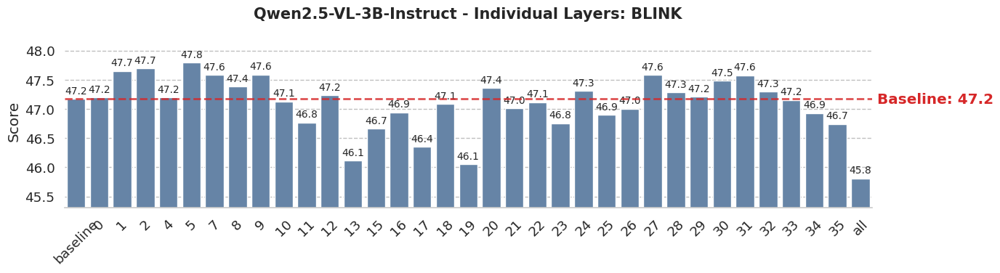

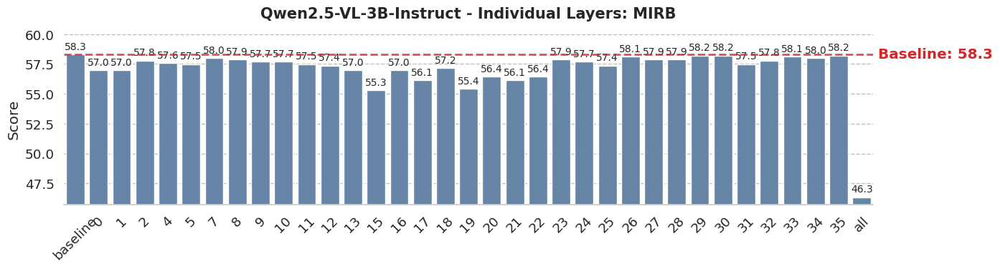

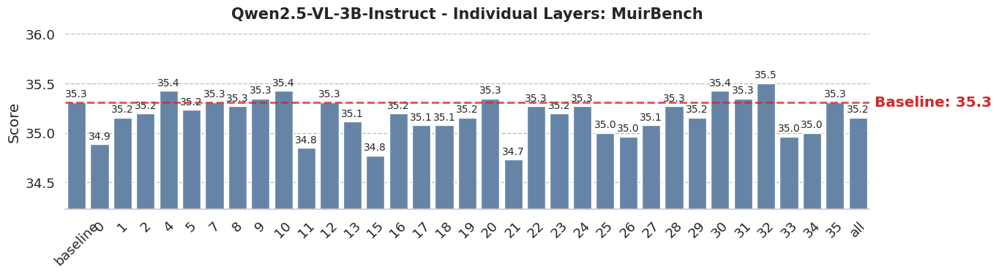

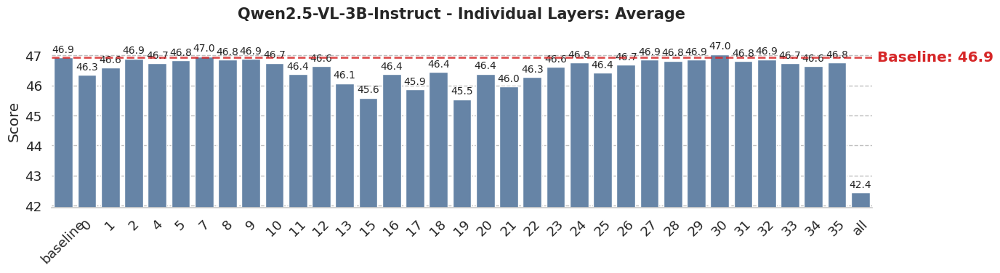

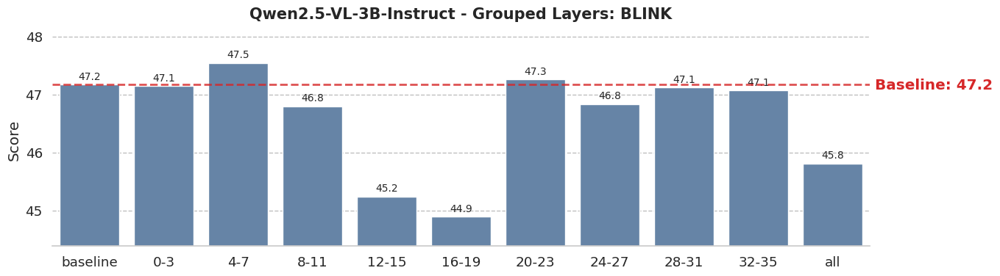

...

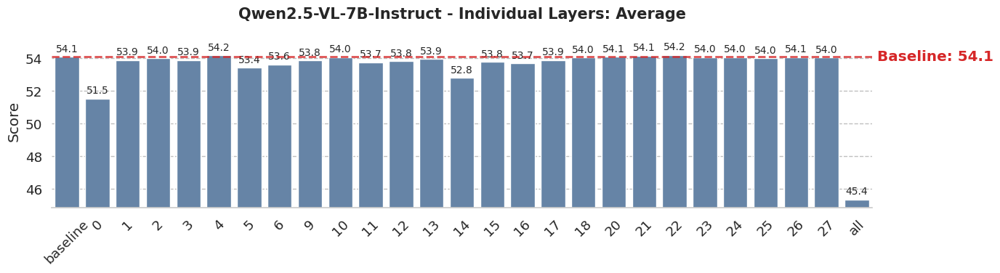

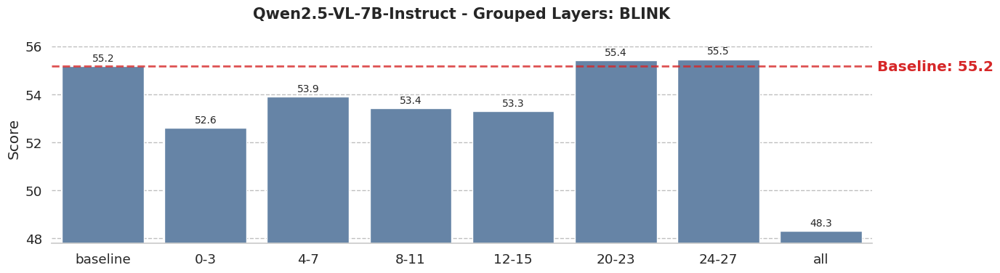

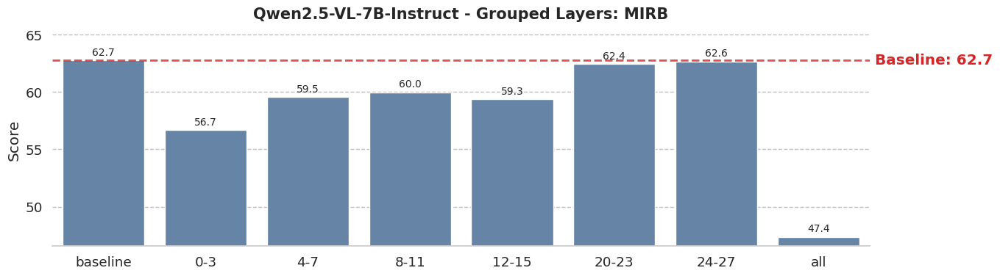

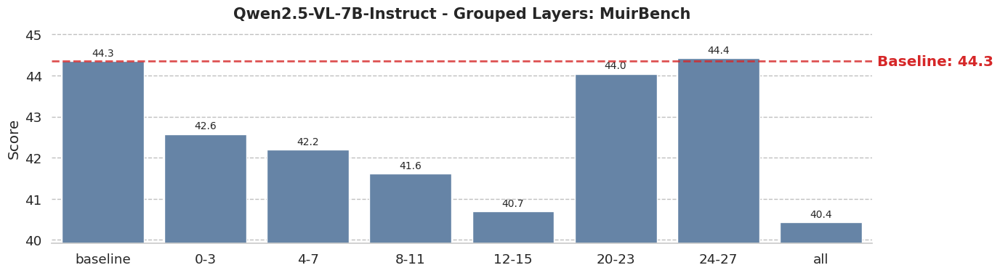

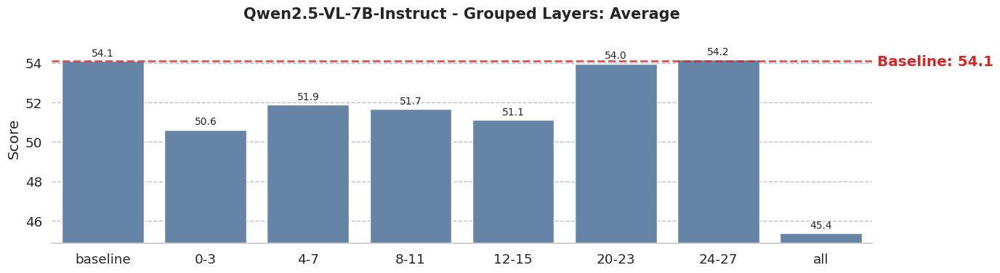

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ==========================================
# 4. PLOTTING (Separate Figures + Value Labels)
# ==========================================

if 'df' in locals() and not df.empty:

    # --- Configuration ---
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.2)
    
    # Define metrics to plot
    main_benchmarks = ['BLINK', 'MIRB', 'MuirBench']
    valid_metrics = [m for m in main_benchmarks if m in df.columns]
    
    if valid_metrics:
        # Recalculate Average
        df['Average'] = df[valid_metrics].mean(axis=1)
        plot_metrics = valid_metrics + ['Average']
    else:
        print("No valid metrics found to plot.")
        plot_metrics = []

    # --- Sorting Logic ---
    def get_sort_key(val):
        s_val = str(val).strip().lower()
        if 'baseline' in s_val: return (0, -1)   # Priority 0: Baseline
        if s_val == 'all': return (3, 999)       # Priority 3: All (Last)
        
        if '-' in s_val:
            try:
                start = int(s_val.split('-')[0])
                return (2, start)                # Priority 2: Ranges
            except: pass
            
        if s_val.isdigit():
            return (1, int(s_val))               # Priority 1: Singles
            
        return (4, 0)

    df['sort_key'] = df['Masked Layers'].apply(get_sort_key)

    # --- Plotting Loop ---
    unique_models = df['Model'].unique()

    for model in unique_models:
        model_df = df[df['Model'] == model].copy()

        # Create two subsets
        # 1. Individual Layers
        mask_singles = model_df['sort_key'].apply(lambda x: x[0] in [0, 1, 3])
        df_singles = model_df[mask_singles].sort_values('sort_key')

        # 2. Grouped Layers
        mask_ranges = model_df['sort_key'].apply(lambda x: x[0] in [0, 2, 3])
        df_ranges = model_df[mask_ranges].sort_values('sort_key')

        datasets = [
            (df_singles, "Individual Layers"),
            (df_ranges, "Grouped Layers")
        ]

        for data, subtitle in datasets:
            if len(data) <= 1: continue

            for metric in plot_metrics:
                
                plt.figure(figsize=(14, 4)) # New figure for every plot
                
                # 1. Extract Baseline Value
                baseline_row = data[data['Masked Layers'].astype(str).str.contains('Baseline', case=False)]
                baseline_val = baseline_row[metric].values[0] if not baseline_row.empty else None

                # 2. Draw Bar Chart
                ax = sns.barplot(
                    data=data,
                    x='Masked Layers',
                    y=metric,
                    color='#5b84b1',
                    edgecolor=None
                )

                # 3. Add Value Labels
                # -------------------------------------------------------
                for container in ax.containers:
                    ax.bar_label(container, fmt='%.1f', padding=3, fontsize=10)
                # -------------------------------------------------------

                # 4. Add Horizontal Baseline Line
                if baseline_val is not None:
                    plt.axhline(y=baseline_val, color='#d62728', linestyle='--', linewidth=2, alpha=0.8, zorder=5)
                    # Add label near the right edge
                    plt.text(x=len(data)-0.5, y=baseline_val, s=f' Baseline: {baseline_val:.1f}', 
                             color='#d62728', va='center', ha='left', fontweight='bold')

                # 5. Smart Y-Axis Limits (Zoom in)
                y_values = data[metric].dropna().values
                if len(y_values) > 0:
                    y_min = y_values.min()
                    y_max = y_values.max()
                    
                    if baseline_val is not None:
                        y_min = min(y_min, baseline_val)
                        y_max = max(y_max, baseline_val)
                    
                    y_range = y_max - y_min
                    # 15% top margin to fit text, 5% bottom margin
                    top_margin = max(y_range * 0.15, 0.5)
                    bottom_margin = max(y_range * 0.05, 0.5)
                    
                    plt.ylim(y_min - bottom_margin, y_max + top_margin)

                # 6. Styling
                plt.title(f"{model} - {subtitle}: {metric}", fontsize=15, fontweight='bold', pad=15)
                plt.xlabel('')
                plt.ylabel('Score')
                sns.despine(left=True)
                plt.grid(axis='y', linestyle='--', alpha=0.5, color='gray')
                plt.grid(axis='x', visible=False)
                
                if 'Individual' in subtitle:
                    plt.xticks(rotation=45)

                plt.tight_layout()
                plt.show()

## Blink

Plotting the following BLINK tasks: ['BLINK', 'Art Style', 'Counting', 'Forensic Detection', 'Functional Correspondence', 'Iq Test', 'Jigsaw', 'Multi View Reasoning', 'Object Localization', 'Relative Depth', 'Relative Reflectance', 'Semantic Correspondence', 'Spatial Relation', 'Visual Correspondence', 'Visual Similarity']


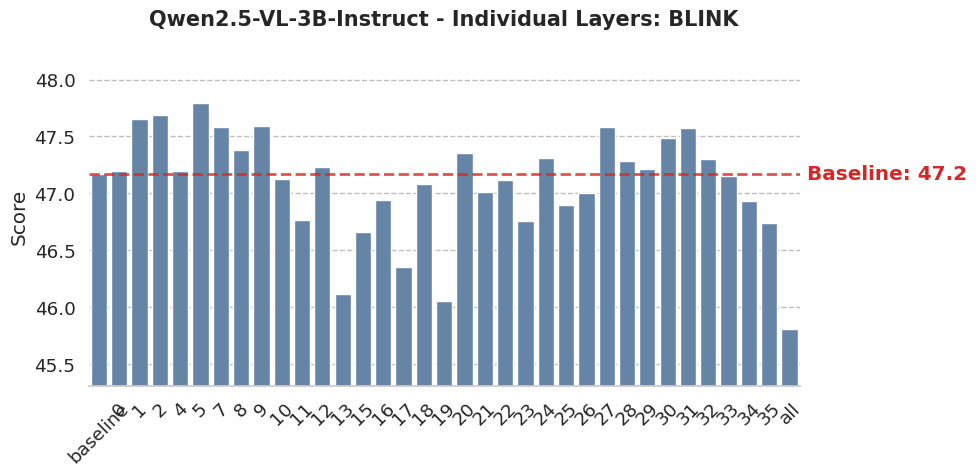

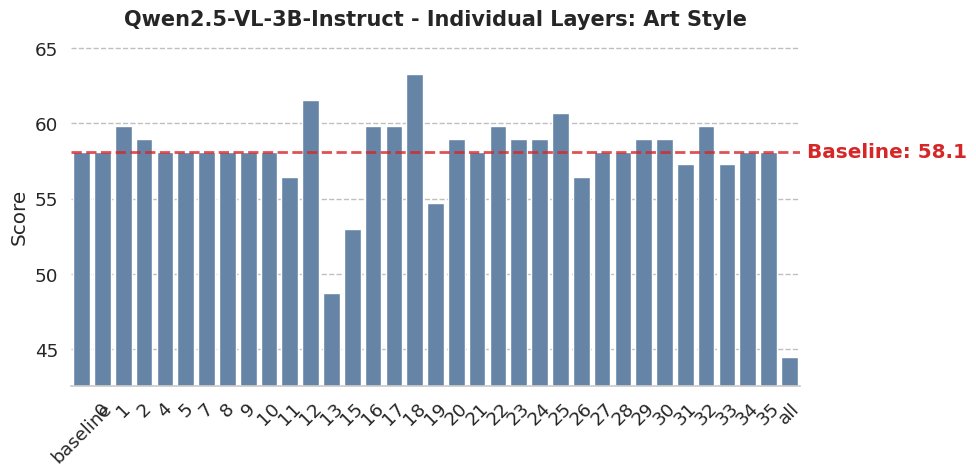

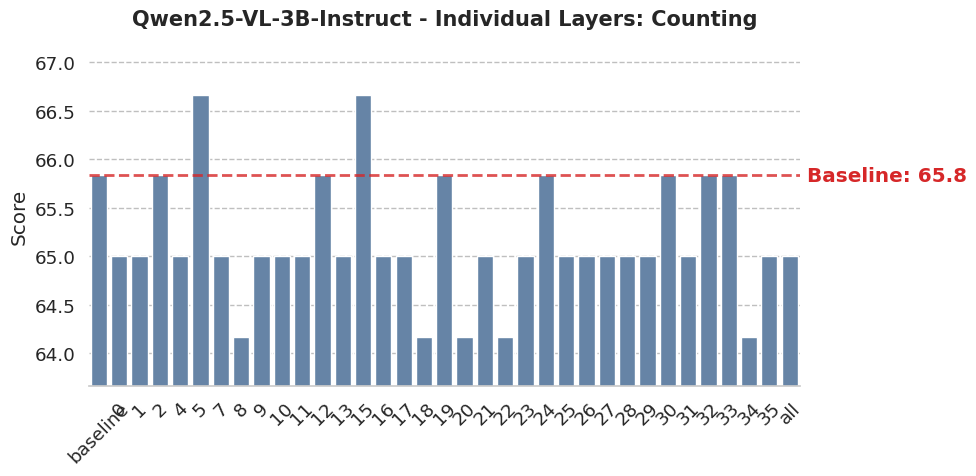

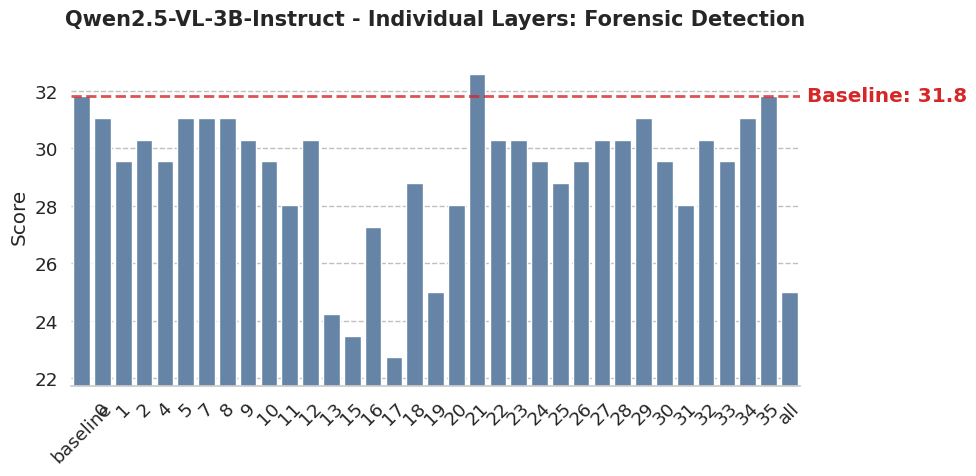

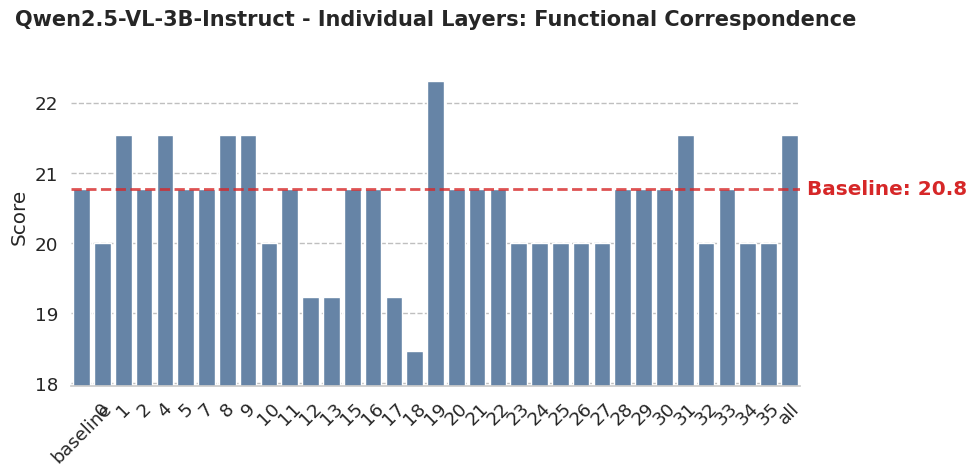

...

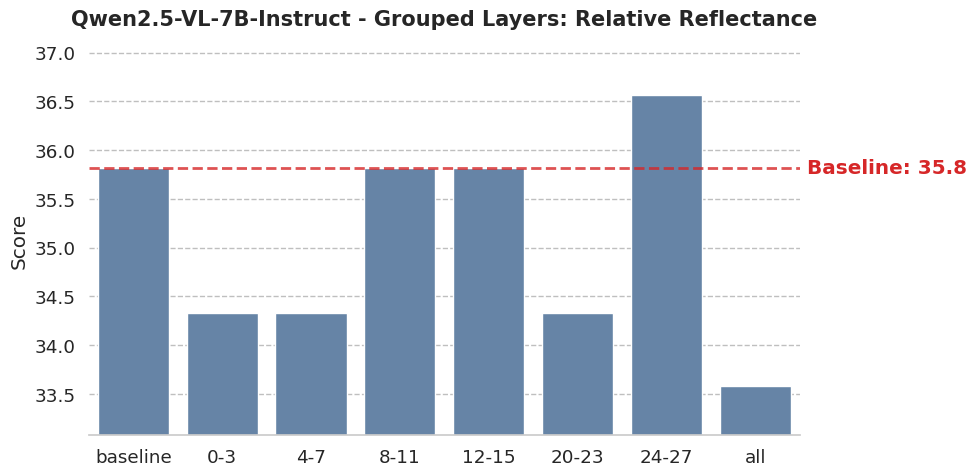

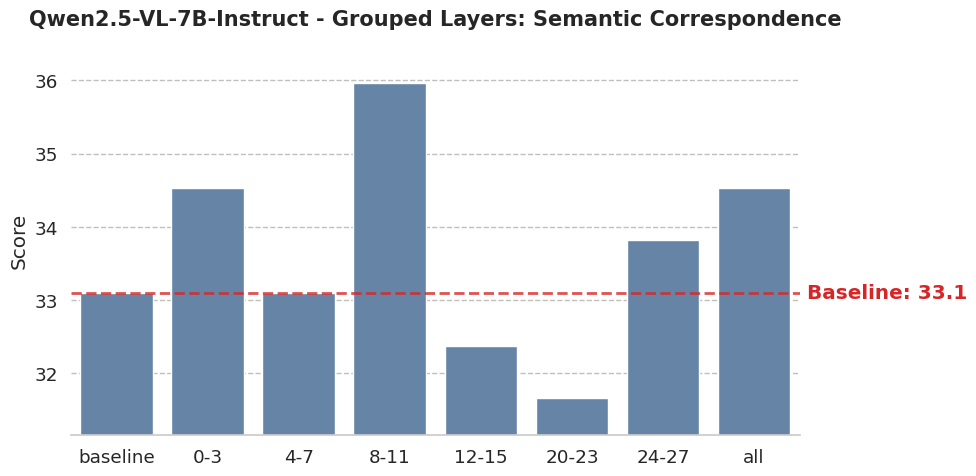

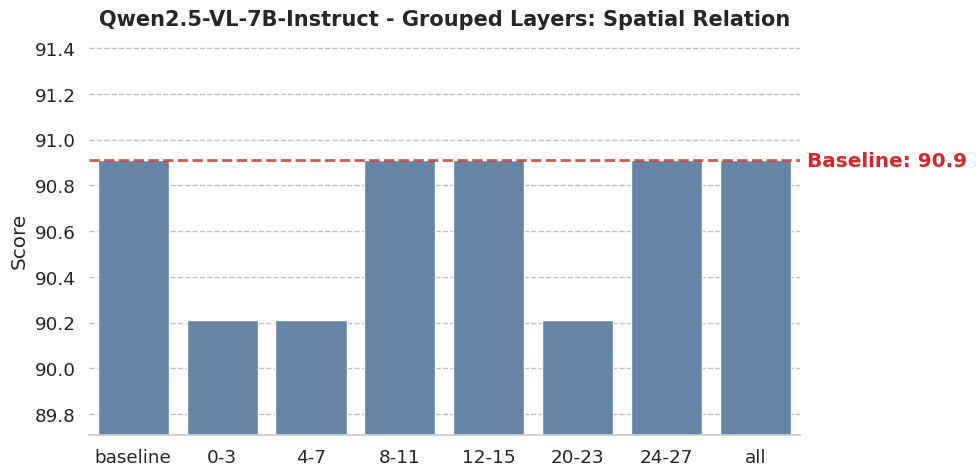

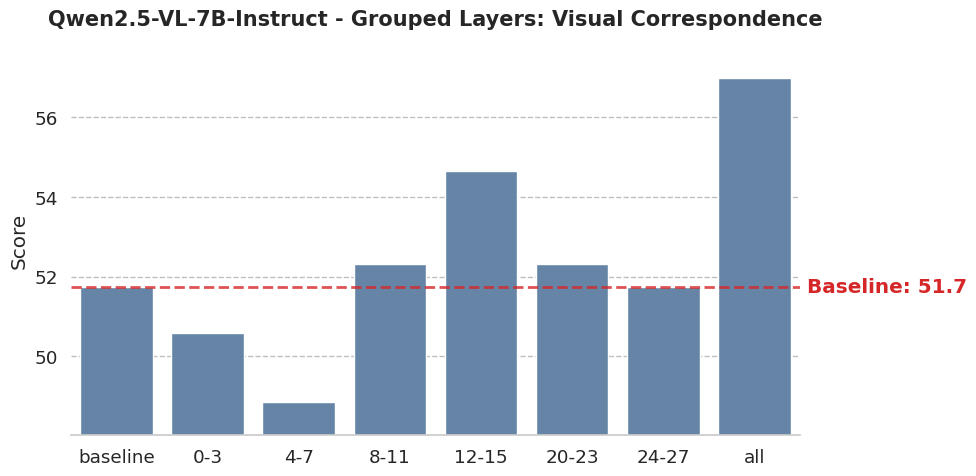

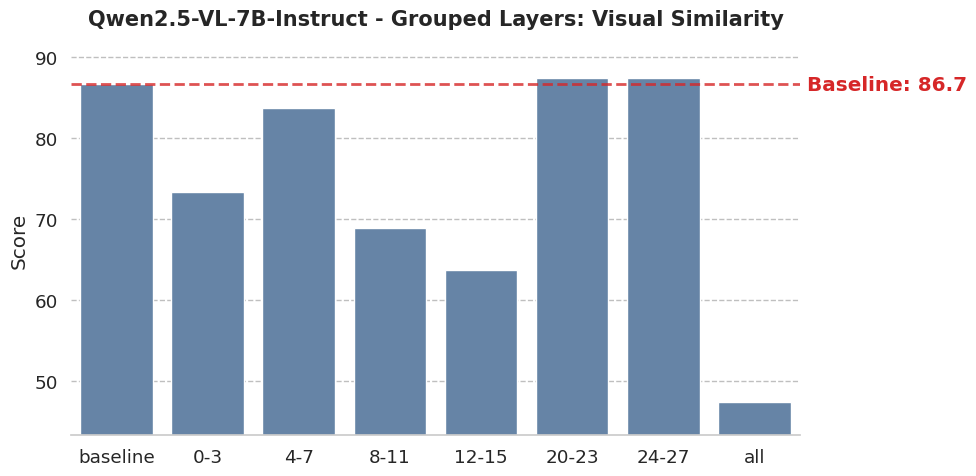

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ==========================================
# BLINK SUBTASKS PLOTTING
# ==========================================

if 'df' in locals() and not df.empty:

    # --- Configuration ---
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.2)

    # 1. Identify BLINK Columns
    # We exclude Metadata, other benchmarks (MIRB, MuirBench), and helper cols
    exclude_cols = ['Model', 'Masked Layers', 'MIRB', 'MuirBench', 'Average', 'sort_key']
    blink_cols = [c for c in df.columns if c not in exclude_cols]
    
    # Sort columns alphabetically, but keep 'BLINK' (Overall) at the top if present
    if 'BLINK' in blink_cols:
        blink_cols.remove('BLINK')
        blink_cols = ['BLINK'] + sorted(blink_cols)
    else:
        blink_cols = sorted(blink_cols)

    print(f"Plotting the following BLINK tasks: {blink_cols}")

    # --- Sorting Logic ---
    def get_sort_key(val):
        s_val = str(val).strip().lower()
        if 'baseline' in s_val: return (0, -1)   # Priority 0: Baseline
        if s_val == 'all': return (3, 999)       # Priority 3: All (Last)
        
        # Check for Range (e.g. "0-3")
        if '-' in s_val:
            try:
                start = int(s_val.split('-')[0])
                return (2, start)                # Priority 2: Ranges
            except: pass
            
        # Check for Single Integer (e.g. "0")
        if s_val.isdigit():
            return (1, int(s_val))               # Priority 1: Singles
            
        return (4, 0)

    # Ensure sort key exists
    df['sort_key'] = df['Masked Layers'].apply(get_sort_key)

    # --- Plotting Loop ---
    unique_models = df['Model'].unique()

    for model in unique_models:
        model_df = df[df['Model'] == model].copy()

        # Create two subsets
        # 1. Individual Layers
        mask_singles = model_df['sort_key'].apply(lambda x: x[0] in [0, 1, 3])
        df_singles = model_df[mask_singles].sort_values('sort_key')

        # 2. Grouped Layers
        mask_ranges = model_df['sort_key'].apply(lambda x: x[0] in [0, 2, 3])
        df_ranges = model_df[mask_ranges].sort_values('sort_key')

        datasets = [
            (df_singles, "Individual Layers"),
            (df_ranges, "Grouped Layers")
        ]

        for data, subtitle in datasets:
            if len(data) <= 1: continue

            # Iterate through each BLINK subtask and create a NEW figure
            for task in blink_cols:
                
                # Skip if column is all NaN for this specific model/subset
                if data[task].isna().all():
                    continue

                plt.figure(figsize=(10, 5))
                
                # 1. Extract Baseline Value
                baseline_row = data[data['Masked Layers'].astype(str).str.contains('Baseline', case=False)]
                baseline_val = baseline_row[task].values[0] if not baseline_row.empty else None

                # 2. Draw Bar Chart
                ax = sns.barplot(
                    data=data,
                    x='Masked Layers',
                    y=task,
                    color='#5b84b1',  # Clean blue
                    edgecolor=None
                )

                # 3. Add Horizontal Baseline Line
                if baseline_val is not None and not np.isnan(baseline_val):
                    plt.axhline(y=baseline_val, color='#d62728', linestyle='--', linewidth=2, alpha=0.8, zorder=5)
                    plt.text(x=len(data)-0.5, y=baseline_val, s=f' Baseline: {baseline_val:.1f}', 
                             color='#d62728', va='center', ha='left', fontweight='bold')

                # 4. Smart Y-Axis Limits (Zoom in)
                y_values = data[task].dropna().values
                if len(y_values) > 0:
                    y_min = y_values.min()
                    y_max = y_values.max()
                    
                    if baseline_val is not None and not np.isnan(baseline_val):
                        y_min = min(y_min, baseline_val)
                        y_max = max(y_max, baseline_val)
                    
                    y_range = y_max - y_min
                    # Minimum margin of 0.5 or 10% of range
                    margin = max(y_range * 0.1, 0.5)
                    
                    # Prevent y-axis from going below 0
                    lower_lim = max(0, y_min - margin)
                    upper_lim = y_max + margin
                    
                    plt.ylim(lower_lim, upper_lim)

                # 5. Styling
                plt.title(f"{model} - {subtitle}: {task}", fontsize=15, fontweight='bold', pad=15)
                plt.xlabel('')
                plt.ylabel('Score')
                sns.despine(left=True)
                plt.grid(axis='y', linestyle='--', alpha=0.5, color='gray')
                plt.grid(axis='x', visible=False)
                
                if 'Individual' in subtitle:
                    plt.xticks(rotation=45)

                plt.tight_layout()
                plt.show()
else:
    print("No Dataframe found.")

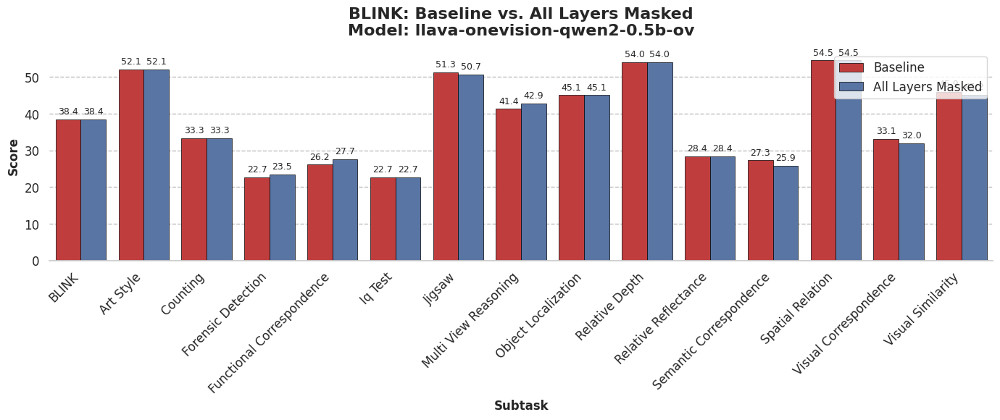

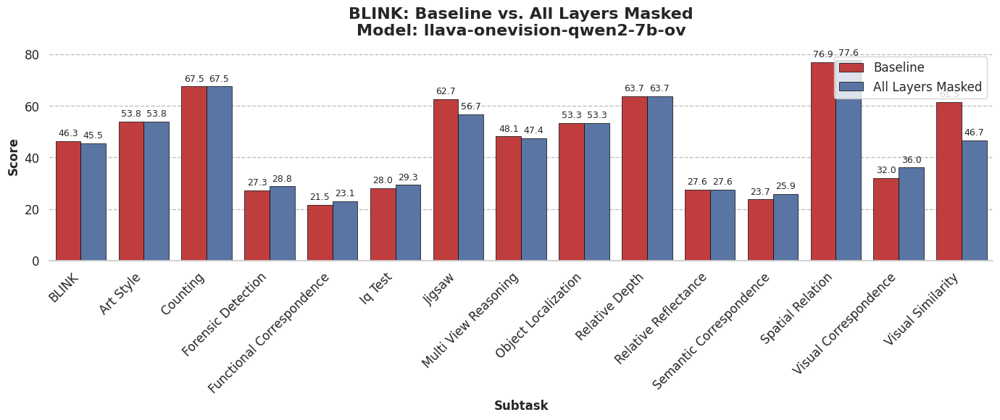

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ==========================================
# BLINK: BASELINE vs ALL (Grouped Bar Plot)
# ==========================================

if 'df' in locals() and not df.empty:
    
    # 1. Identify BLINK Columns
    # We use the same exclusion logic to isolate BLINK tasks
    exclude_cols = ['Model', 'Masked Layers', 'MIRB', 'MuirBench', 'Average', 'sort_key']
    blink_cols = [c for c in df.columns if c not in exclude_cols]
    
    # Sort: Overall 'BLINK' first, then alphabetical
    if 'BLINK' in blink_cols:
        blink_cols.remove('BLINK')
        blink_cols = ['BLINK'] + sorted(blink_cols)
    else:
        blink_cols = sorted(blink_cols)

    # 2. Filter for Baseline and All
    mask = df['Masked Layers'].astype(str).str.lower().isin(['baseline', 'all'])
    df_filtered = df[mask].copy()
    
    # Create a readable 'Configuration' column for the legend
    df_filtered['Configuration'] = df_filtered['Masked Layers'].apply(
        lambda x: 'Baseline' if 'baseline' in str(x).lower() else 'All Layers Masked'
    )
    
    # 3. Melt Data
    # We keep Model and Configuration as identifiers
    id_vars = ['Model', 'Configuration']
    
    # We only melt the identified BLINK columns that exist in the filtered df
    valid_blink_cols = [c for c in blink_cols if c in df_filtered.columns]
    
    df_long = df_filtered.melt(
        id_vars=id_vars,
        value_vars=valid_blink_cols,
        var_name='Task',
        value_name='Score'
    )
    
    # 4. Plotting Loop
    unique_models = df_long['Model'].unique()
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.1)

    for model in unique_models:
        model_data = df_long[df_long['Model'] == model].copy()
        
        # Ensure we plot in the sorted order defined in blink_cols
        # Filter tasks that actually exist for this model to avoid empty bars
        existing_tasks = [t for t in blink_cols if t in model_data['Task'].unique()]
        
        plt.figure(figsize=(14, 6))
        
        ax = sns.barplot(
            data=model_data,
            x='Task',
            y='Score',
            hue='Configuration',
            hue_order=['Baseline', 'All Layers Masked'],
            order=existing_tasks,
            palette=['#d62728', '#4c72b0'], # Red/Blue
            edgecolor='black',
            linewidth=0.5
        )
        
        # Styling
        # Clean model name if it has double underscores (e.g. llava__ov)
        clean_model_name = model.split("__")[1] if "__" in model else model
        
        plt.title(f"BLINK: Baseline vs. All Layers Masked\nModel: {clean_model_name}", 
                  fontsize=16, fontweight='bold', pad=15)
        plt.xlabel('Subtask', fontsize=12, fontweight='bold')
        plt.ylabel('Score', fontsize=12, fontweight='bold')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title=None, loc='upper right')
        
        sns.despine(left=True)
        ax.yaxis.grid(True, linestyle='--', alpha=0.5, color='gray')
        ax.xaxis.grid(False)
        
        # Add values on top of bars
        for container in ax.containers:
            ax.bar_label(container, fmt='%.1f', fontsize=9, padding=3)
            
        plt.tight_layout()
        plt.show()

else:
    print("No BLINK data available (df is empty or missing).")

In [4]:
# ==========================================
# PRINT COMPARISON: BASELINE vs ALL
# ==========================================

if 'df' in locals() and not df.empty:
    
    # 1. Re-identify BLINK Columns (or use existing list)
    exclude_cols = ['Model', 'Masked Layers', 'MIRB', 'MuirBench', 'Average', 'sort_key']
    task_cols = [c for c in df.columns if c not in exclude_cols]
    
    # Ensure Overall 'BLINK' is separate or included as desired. 
    # Usually we want to see it, so we keep it.
    
    print("\n" + "="*60)
    print("DETAILED COMPARISON: Baseline vs. All Layers Masked")
    print("="*60)

    unique_models = df['Model'].unique()

    for model in unique_models:
        print(f"\nModel: {model}")
        print("-" * 30)
        
        # Extract rows
        base_row = df[(df['Model'] == model) & (df['Masked Layers'].astype(str).str.lower().str.contains('baseline'))]
        all_row = df[(df['Model'] == model) & (df['Masked Layers'].astype(str).str.lower() == 'all')]
        
        if base_row.empty or all_row.empty:
            print("  [!] Missing 'Baseline' or 'All' data for this model.")
            continue
            
        better_than_all = []
        worse_than_all = []
        
        for task in task_cols:
            # Get values safely
            try:
                b_val = base_row[task].values[0]
                a_val = all_row[task].values[0]
                
                # Skip if NaN
                if pd.isna(b_val) or pd.isna(a_val):
                    continue
                
                diff = b_val - a_val
                
                # Categorize
                if diff > 0:
                    # Baseline is Better
                    better_than_all.append((task, b_val, a_val, diff))
                elif diff < 0:
                    # Baseline is Worse (All is Better)
                    worse_than_all.append((task, b_val, a_val, abs(diff)))
                    
            except IndexError:
                continue

        # --- PRINT RESULTS ---
        
        # 1. Baseline Better
        print(f"  [Baseline > All] (Baseline is better in {len(better_than_all)} tasks):")
        if better_than_all:
            # Sort by difference descending (largest gap first)
            better_than_all.sort(key=lambda x: x[3], reverse=True)
            for t, b, a, d in better_than_all:
                print(f"    • {t:<20} : {b:.1f} vs {a:.1f} (Diff: +{d:.1f})")
        else:
            print("    None")
            
        print("")

        # 2. Baseline Worse
        print(f"  [Baseline < All] (Baseline is worse in {len(worse_than_all)} tasks):")
        if worse_than_all:
            # Sort by difference descending
            worse_than_all.sort(key=lambda x: x[3], reverse=True)
            for t, b, a, d in worse_than_all:
                print(f"    • {t:<20} : {b:.1f} vs {a:.1f} (Diff: -{d:.1f})")
        else:
            print("    None")
            
        print("-" * 60)


DETAILED COMPARISON: Baseline vs. All Layers Masked

Model: Qwen2.5-VL-3B-Instruct
------------------------------
  [Baseline > All] (Baseline is better in 7 tasks):
    • Visual Similarity    : 61.5 vs 46.7 (Diff: +14.8)
    • Art Style            : 58.1 vs 44.4 (Diff: +13.7)
    • Forensic Detection   : 31.8 vs 25.0 (Diff: +6.8)
    • Relative Reflectance : 40.3 vs 38.8 (Diff: +1.5)
    • BLINK                : 47.2 vs 45.8 (Diff: +1.4)
    • Counting             : 65.8 vs 65.0 (Diff: +0.8)
    • Spatial Relation     : 84.6 vs 83.9 (Diff: +0.7)

  [Baseline < All] (Baseline is worse in 5 tasks):
    • Jigsaw               : 46.0 vs 55.3 (Diff: -9.3)
    • Semantic Correspondence : 26.6 vs 31.7 (Diff: -5.0)
    • Visual Correspondence : 30.2 vs 33.7 (Diff: -3.5)
    • Functional Correspondence : 20.8 vs 21.5 (Diff: -0.8)
    • Iq Test              : 22.7 vs 23.3 (Diff: -0.7)
------------------------------------------------------------

Model: Qwen2.5-VL-7B-Instruct
------------------

## Muirbench

In [9]:
import json
import glob
import os
import pandas as pd

# ==========================================
# 1. CONFIGURATION
# ==========================================

LOG_DIRECTORIES = "/lustre/groups/eml/projects/huang/multi_image/lmms-eval/logs/qwen2_5_vl-mask-attention"

# ==========================================
# 2. HELPER FUNCTIONS
# ==========================================

def normalize_val(val):
    """Normalizes answers (e.g., '4.0' -> '4', 'Yes' -> 'yes')."""
    s = str(val).strip().lower()
    try:
        f_val = float(s)
        if f_val.is_integer():
            return str(int(f_val))
    except:
        pass
    return s

def calculate_acc(correct, total):
    return (correct / total * 100) if total > 0 else 0.0

def parse_muirbench(file_path):
    stats = {} 
    total_correct = 0
    total_count = 0
    
    try:
        with open(file_path, 'r') as f:
            for line in f:
                entry = json.loads(line)
                info = entry.get('muirbench_score_overall', {})
                if not info: continue
                
                task = info.get('task', 'Unknown')
                pred = normalize_val(info.get('pred', ''))
                ans  = normalize_val(info.get('answer', ''))
                
                is_correct = (pred == ans)
                
                # Update Subtask Stats
                if task not in stats: stats[task] = {'c': 0, 't': 0}
                stats[task]['t'] += 1
                if is_correct: stats[task]['c'] += 1
                
                # Update Overall Stats
                total_count += 1
                if is_correct: total_correct += 1
                
    except Exception as e:
        return None
        
    # Build Result Dict (Now including counts for weighting!)
    results = {}
    for k, v in stats.items():
        results[k] = calculate_acc(v['c'], v['t'])
        results[f"{k}_count"] = v['t'] # Save the total questions for this task
        
    results['Overall'] = calculate_acc(total_correct, total_count)
    return results
        

def parse_mirb(file_path):
    stats = {}
    total_correct = 0
    total_count = 0
    
    try:
        with open(file_path, 'r') as f:
            for line in f:
                entry = json.loads(line)
                info = entry.get('mirb_score', {})
                if not info: continue
                
                subset = info.get('subset', 'Unknown')
                
                # Handle List Predictions
                pred_raw = info.get('pred_answer', [])
                pred_val = pred_raw[0] if isinstance(pred_raw, list) and pred_raw else pred_raw
                
                pred = normalize_val(pred_val)
                ans  = normalize_val(info.get('answers', ''))
                
                is_correct = (pred == ans)
                
                # Update Subset Stats
                if subset not in stats: stats[subset] = {'c': 0, 't': 0}
                stats[subset]['t'] += 1
                if is_correct: stats[subset]['c'] += 1
                
                # Update Overall Stats
                total_count += 1
                if is_correct: total_correct += 1
                
    except Exception as e:
        return None
        
    # Build Result Dict
    results = {k: calculate_acc(v['c'], v['t']) for k, v in stats.items()}
    results['Overall'] = calculate_acc(total_correct, total_count)
    return results

# ==========================================
# 3. MAIN EXECUTION
# ==========================================

muir_rows = []

results_files = glob.glob(os.path.join(LOG_DIRECTORIES, "**", "*_results.json"), recursive=True)

for res_file in results_files:
    dir_name = os.path.dirname(res_file)
    base_name = os.path.basename(res_file).replace('_results.json', '')
    
    try:
        with open(res_file, 'r') as f:
            meta = json.load(f)
            model_name = meta.get('model_name_sanitized', meta.get('model_name', 'Unknown'))
    except:
        continue
        
    # MuirBench
    muir_path = os.path.join(dir_name, f"{base_name}_samples_muirbench.jsonl")
    layer = muir_path.split("/")[-3].split("-mask-attention-")[-1]
    if os.path.exists(muir_path):
        scores = parse_muirbench(muir_path)
        if scores:
            row = {'Model': model_name, 'Masked Layers': layer}
            row.update(scores)
            muir_rows.append(row)
                
        
# ==========================================
# 4. DISPLAY
# ==========================================

def display_table(data_rows, title):
    if not data_rows:
        return

    df = pd.DataFrame(data_rows)
    # Drop the column ending with _count
    df = df.drop(columns=[c for c in df.columns if c.endswith('_count')])
    # 1. Sort Rows
    df = df.sort_values(by=['Model', 'Masked Layers']).reset_index(drop=True)
    # Helper function to create a sorting key for 'Masked Layers'
    import re

    def masked_layer_sort_key(x):
        # Put 'baseline' and 'all' at the very top
        x_lower = str(x).lower()
        if x_lower == 'baseline' or x_lower == 'all':
            return (0, 0, 0)
        # Individual layer: just a single integer (e.g. '0', '5')
        if re.fullmatch(r'\d+', str(x)):
            return (1, int(x), 0)
        # Grouped range: e.g. '0-3', '4-7'
        m = re.fullmatch(r'(\d+)\-(\d+)', str(x))
        if m:
            return (2, int(m.group(1)), int(m.group(2)))
        # Other: put at end
        return (3, 0, 0)

    df = df.copy()
    df['__ml_sortkey'] = df['Masked Layers'].map(masked_layer_sort_key)
    df = df.sort_values(by=['Model', '__ml_sortkey']).reset_index(drop=True)
    df = df.drop(columns="__ml_sortkey")
    
    # 2. Sort Columns
    meta = ['Model', 'Masked Layers']
    
    # Get all other columns
    others = [c for c in df.columns if c not in meta]
    
    # Force 'Overall' to be first, then sort the rest alphabetically
    if 'Overall' in others:
        others.remove('Overall')
        metrics = ['Overall'] + sorted(others)
    else:
        metrics = sorted(others)
        
    final_cols = meta + metrics
    df = df[final_cols]
    
    print(f"\n### {title}")
    display(
        df.style.format(precision=1, na_rep="-")
        .background_gradient(cmap='Blues', subset=metrics)
        .set_properties(**{'text-align': 'center'})
    )
    print(f"\n--- Copy Below for Excel/Google Sheets ({title}) ---")
    print(df.to_csv(sep='\t', index=False, float_format='%.1f'))

display_table(muir_rows, "MuirBench Task Breakdown (with Overall)")


### MuirBench Task Breakdown (with Overall)


,Model,Masked Layers,Overall,Action Understanding,Attribute Similarity,Cartoon Understanding,Counting,Diagram Understanding,Difference Spotting,Geographic Understanding,Image-Text Matching,Ordering,Scene Understanding,Visual Grounding,Visual Retrieval
0,Qwen__Qwen2.5-VL-3B-Instruct,all,35.2,34.8,51.0,46.2,33.8,32.2,20.3,17.0,38.8,10.9,58.1,41.7,33.6
1,Qwen__Qwen2.5-VL-3B-Instruct,baseline,35.3,35.4,49.0,42.3,38.0,35.4,26.8,20.0,39.7,9.4,59.7,31.0,21.6
2,Qwen__Qwen2.5-VL-3B-Instruct,0,34.9,34.8,50.0,42.3,37.2,35.4,25.3,18.0,39.0,9.4,59.1,33.3,21.2
3,Qwen__Qwen2.5-VL-3B-Instruct,1,35.2,34.8,49.0,42.3,38.0,34.9,26.2,19.0,39.4,9.4,59.7,32.1,22.3
4,Qwen__Qwen2.5-VL-3B-Instruct,2,35.2,35.4,49.0,42.3,38.5,34.9,26.5,21.0,39.0,9.4,59.1,33.3,21.6
5,Qwen__Qwen2.5-VL-3B-Instruct,4,35.4,35.4,49.5,42.3,38.0,34.2,25.9,21.0,39.4,9.4,59.7,36.9,23.3
6,Qwen__Qwen2.5-VL-3B-Instruct,5,35.2,34.8,48.0,44.9,38.0,35.9,26.2,18.0,38.6,9.4,59.1,34.5,22.9
7,Qwen__Qwen2.5-VL-3B-Instruct,7,35.3,34.8,48.5,42.3,38.5,35.2,26.8,21.0,40.3,9.4,59.1,31.0,21.2
8,Qwen__Qwen2.5-VL-3B-Instruct,8,35.3,35.4,49.0,42.3,38.5,35.7,26.5,20.0,39.0,9.4,59.7,33.3,21.2
9,Qwen__Qwen2.5-VL-3B-Instruct,9,35.3,35.4,49.0,42.3,38.9,34.7,26.5,20.0,39.4,9.4,59.7,33.3,22.3



--- Copy Below for Excel/Google Sheets (MuirBench Task Breakdown (with Overall)) ---
Model	Masked Layers	Overall	Action Understanding	Attribute Similarity	Cartoon Understanding	Counting	Diagram Understanding	Difference Spotting	Geographic Understanding	Image-Text Matching	Ordering	Scene Understanding	Visual Grounding	Visual Retrieval
Qwen__Qwen2.5-VL-3B-Instruct	all	35.2	34.8	51.0	46.2	33.8	32.2	20.3	17.0	38.8	10.9	58.1	41.7	33.6
Qwen__Qwen2.5-VL-3B-Instruct	baseline	35.3	35.4	49.0	42.3	38.0	35.4	26.8	20.0	39.7	9.4	59.7	31.0	21.6
Qwen__Qwen2.5-VL-3B-Instruct	0	34.9	34.8	50.0	42.3	37.2	35.4	25.3	18.0	39.0	9.4	59.1	33.3	21.2
Qwen__Qwen2.5-VL-3B-Instruct	1	35.2	34.8	49.0	42.3	38.0	34.9	26.2	19.0	39.4	9.4	59.7	32.1	22.3
Qwen__Qwen2.5-VL-3B-Instruct	2	35.2	35.4	49.0	42.3	38.5	34.9	26.5	21.0	39.0	9.4	59.1	33.3	21.6
Qwen__Qwen2.5-VL-3B-Instruct	4	35.4	35.4	49.5	42.3	38.0	34.2	25.9	21.0	39.4	9.4	59.7	36.9	23.3
Qwen__Qwen2.5-VL-3B-Instruct	5	35.2	34.8	48.0	44.9	38.0	35.9	26.2	18.0	38.6	9.4	59.


### Baseline vs. Ceiling MuirBench Results (Highlighted by Improvement)


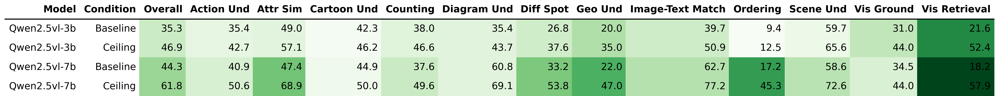

In [ ]:
import io
import json
import glob
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import dataframe_image as dfi
from IPython.display import Image, display

# ==========================================
# 1. CONFIGURATION
# ==========================================

LOG_DIRECTORIES = "/lustre/groups/eml/projects/huang/multi_image/lmms-eval/logs/qwen2_5_vl-mask-attention"

SUBTASK_NAME_MAP = {
    "Scene Understanding": "Scene Und",
    "Spatial Relation": "Spatial",
    "Object Recognition": "Object Recog",
    "Document Understanding": "Doc Und",
    "Action Understanding": "Action Und",
    "Attribute Similarity": "Attr Sim",
    "Cartoon Understanding": "Cartoon Und",
    "Diagram Understanding": "Diagram Und",
    "Difference Spotting": "Diff Spot",
    "Geographic Understanding": "Geo Und",
    "Image-Text Matching": "Image-Text Match",
    "Visual Grounding": "Vis Ground",
    "Visual Retrieval": "Vis Retrieval",
}

# ==========================================
# 2. HELPER FUNCTIONS
# ==========================================

def normalize_val(val):
    s = str(val).strip().lower()
    try:
        f_val = float(s)
        if f_val.is_integer(): return str(int(f_val))
    except: pass
    return s

def calculate_acc(correct, total):
    return (correct / total * 100) if total > 0 else 0.0

def simplify_model_name(name):
    name_lower = str(name).lower()
    if '3b' in name_lower: return 'Qwen2.5vl-3b'
    elif '7b' in name_lower: return 'Qwen2.5vl-7b'
    return name

# ==========================================
# 3. DATA PARSING (Sample-Level Logic)
# ==========================================

baseline_stats = {}
ceiling_stats = {}

results_files = glob.glob(os.path.join(LOG_DIRECTORIES, "**", "*_results.json"), recursive=True)

for res_file in results_files:
    dir_name = os.path.dirname(res_file)
    base_name = os.path.basename(res_file).replace('_results.json', '')
    
    try:
        with open(res_file, 'r') as f:
            meta = json.load(f)
            model_name = meta.get('model_name_sanitized', meta.get('model_name', 'Unknown'))
    except: continue
        
    muir_path = os.path.join(dir_name, f"{base_name}_samples_muirbench.jsonl")
    
    if os.path.exists(muir_path):
        try:
            layer = muir_path.split("/")[-3].split("-mask-attention-")[-1].lower()
        except: layer = "unknown"
            
        is_baseline = (layer == 'baseline')
        
        if model_name not in ceiling_stats: ceiling_stats[model_name] = {}
        if model_name not in baseline_stats: baseline_stats[model_name] = {}
            
        try:
            with open(muir_path, 'r') as f:
                for line in f:
                    entry = json.loads(line)
                    info = entry.get('muirbench_score_overall', {})
                    if not info: continue
                    
                    doc_id = entry.get('doc_id', info.get('idx'))
                    task = info.get('task', 'Unknown')
                    pred = normalize_val(info.get('pred', ''))
                    ans  = normalize_val(info.get('answer', ''))
                    is_correct = (pred == ans)
                    
                    # Track Ceiling
                    if task not in ceiling_stats[model_name]: ceiling_stats[model_name][task] = {}
                    ceiling_stats[model_name][task][doc_id] = ceiling_stats[model_name][task].get(doc_id, False) or is_correct
                    
                    # Track Baseline
                    if is_baseline:
                        if task not in baseline_stats[model_name]: baseline_stats[model_name][task] = {}
                        baseline_stats[model_name][task][doc_id] = is_correct
        except: continue

final_rows = []

for model_name in ceiling_stats.keys():
    # Baseline
    if model_name in baseline_stats and baseline_stats[model_name]:
        base_row = {'Model': model_name, 'Condition': 'Baseline'}
        tc_base, tot_base = 0, 0
        for task, docs in baseline_stats[model_name].items():
            task_total = len(docs)
            task_correct = sum(docs.values())
            base_row[task] = calculate_acc(task_correct, task_total)
            tot_base += task_total
            tc_base += task_correct
        base_row['Overall'] = calculate_acc(tc_base, tot_base)
        final_rows.append(base_row)
        
    # Ceiling
    ceil_row = {'Model': model_name, 'Condition': 'Ceiling'}
    tc_ceil, tot_ceil = 0, 0
    for task, docs in ceiling_stats[model_name].items():
        task_total = len(docs)
        task_correct = sum(docs.values())
        ceil_row[task] = calculate_acc(task_correct, task_total)
        tot_ceil += task_total
        tc_ceil += task_correct
    ceil_row['Overall'] = calculate_acc(tc_ceil, tot_ceil)
    final_rows.append(ceil_row)

# ==========================================
# 4. FORMATTING & VISUALIZATION
# ==========================================

df = pd.DataFrame(final_rows)

if not df.empty:
    # Cleanup Names
    df['Model'] = df['Model'].apply(simplify_model_name)
    df = df.rename(columns=SUBTASK_NAME_MAP)
    
    # Sort Columns
    meta = ['Model', 'Condition']
    metrics = [c for c in df.columns if c not in meta]
    if 'Overall' in metrics:
        metrics.remove('Overall')
        metrics = ['Overall'] + sorted(metrics)
    else:
        metrics = sorted(metrics)
        
    df = df[meta + metrics]
    df = df.sort_values(by=['Model', 'Condition']).reset_index(drop=True)

    # Calculate Deltas for Color Map
    gmap_df = pd.DataFrame(0.0, index=df.index, columns=metrics)
    for model in df['Model'].unique():
        baseline_mask = (df['Model'] == model) & (df['Condition'] == 'Baseline')
        ceiling_mask = (df['Model'] == model) & (df['Condition'] == 'Ceiling')
        
        if baseline_mask.any() and ceiling_mask.any():
            idx_base = df[baseline_mask].index[0]
            idx_ceil = df[ceiling_mask].index[0]
            
            for col in metrics:
                delta = df.at[idx_ceil, col] - df.at[idx_base, col]
                gmap_df.at[idx_base, col] = delta
                gmap_df.at[idx_ceil, col] = delta

    # Render Table as Image
    print("\n### Baseline vs. Ceiling MuirBench Results (Highlighted by Improvement)")

    styled_table = (
        df.style.format(precision=1, na_rep="-")
        .hide(axis="index")  
        .background_gradient(cmap='Greens', subset=metrics, gmap=gmap_df, axis=None)
        .set_properties(subset=['Model', 'Condition'], 
                        **{'background-color': '#ffffff', 'color': '#000000', 'font-weight': 'bold'})
        .set_properties(subset=metrics, 
                        **{'text-align': 'center', 'border': '1px solid black', 'color': '#000000'})
        .set_table_styles([
            {'selector': 'th', 'props': [
                ('font-size', '12pt'), 
                ('text-align', 'center'), 
                ('background-color', '#e6e6e6'), 
                ('color', '#000000'), 
                ('border', '1px solid black')
            ]},
            {'selector': 'td', 'props': [
                ('font-size', '11pt'), 
                ('border', '1px solid black')
            ]}
        ])
    )

    buf = io.BytesIO()
    try:
        dfi.export(styled_table, buf, table_conversion='matplotlib', dpi=300)
        display(Image(data=buf.getvalue(), format='png'))
    except Exception as e:
        print(f"\nCould not render image. Error: {e}")
        display(styled_table)

else:
    print("No data available to process.")


### Baseline vs. Best MuirBench Results (Highlighted by Improvement)


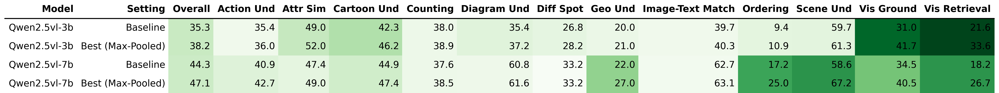

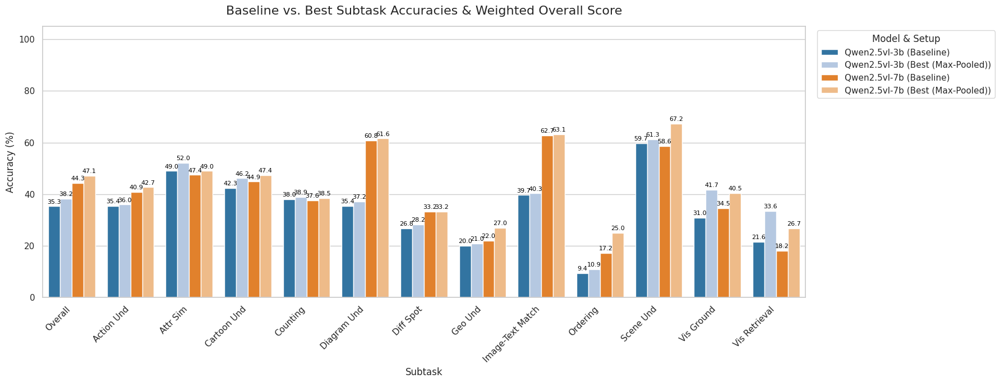

In [6]:
import io
import json
import glob
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import dataframe_image as dfi
from IPython.display import Image, display

# ==========================================
# CUSTOMIZATION: Shorten Subtask Names
# ==========================================
SUBTASK_NAME_MAP = {
    "Scene Understanding": "Scene Und",
    "Spatial Relation": "Spatial",
    "Object Recognition": "Object Recog",
    "Document Understanding": "Doc Und",
    "Action Understanding": "Action Und",
    "Attribute Similarity": "Attr Sim",
    "Cartoon Understanding": "Cartoon Und",
    "Diagram Understanding": "Diagram Und",
    "Difference Spotting": "Diff Spot",
    "Geographic Understanding": "Geo Und",
    "Image-Text Matching": "Image-Text Match",
    "Visual Grounding": "Vis Ground",
    "Visual Retrieval": "Vis Retrieval",
}

def simplify_model_name(name):
    """Simplifies the raw model name from the logs to a cleaner format."""
    name_lower = str(name).lower()
    if '3b' in name_lower:
        return 'Qwen2.5vl-3b'
    elif '7b' in name_lower:
        return 'Qwen2.5vl-7b'
    return name

# Assume muir_rows is already generated from your log parsing loop
df = pd.DataFrame(muir_rows)

if not df.empty:
    # 0. Simplify Model Names
    df['Model'] = df['Model'].apply(simplify_model_name)
    
    # 0.5 Rename Subtasks (both the accuracy columns and their hidden _count columns)
    rename_dict = {}
    for old_name, short_name in SUBTASK_NAME_MAP.items():
        # Only add to dict if the column actually exists in the data
        if old_name in df.columns:
            rename_dict[old_name] = short_name
        if f"{old_name}_count" in df.columns:
            rename_dict[f"{old_name}_count"] = f"{short_name}_count"
            
    df = df.rename(columns=rename_dict)

    # 1. Identify subtasks and their corresponding count columns
    all_cols = df.columns.tolist()
    count_cols = [c for c in all_cols if c.endswith('_count')]
    subtasks = [c.replace('_count', '') for c in count_cols]
    
    # 2. Extract the Baseline results
    baseline_df = df[df['Masked Layers'].astype(str).str.lower() == 'baseline'].copy()
    baseline_df['Setting'] = 'Baseline'
    
    # 3. Calculate the Best (Max-Pooled) results
    best_df = df.groupby('Model')[subtasks].max().reset_index()
    best_df['Setting'] = 'Best (Max-Pooled)'
    
    # 4. Calculate the TRUE Weighted 'Overall' for the Best setup
    task_counts = df.groupby('Model')[count_cols].first().reset_index()
    task_counts['total_instances'] = task_counts[count_cols].sum(axis=1)
    
    for model in best_df['Model'].unique():
        model_best_idx = best_df.index[best_df['Model'] == model].tolist()[0]
        model_count_idx = task_counts.index[task_counts['Model'] == model].tolist()[0]
        
        total_correct_theoretical = 0
        for task in subtasks:
            acc = best_df.at[model_best_idx, task]
            count = task_counts.at[model_count_idx, f"{task}_count"]
            total_correct_theoretical += (acc / 100.0) * count
            
        total_instances = task_counts.at[model_count_idx, 'total_instances']
        best_df.at[model_best_idx, 'Overall'] = (total_correct_theoretical / total_instances) * 100

    # 5. Combine Baseline and Best DataFrames
    combined_df = pd.concat([
        baseline_df[['Model', 'Setting', 'Overall'] + sorted(subtasks)],
        best_df[['Model', 'Setting', 'Overall'] + sorted(subtasks)]
    ], ignore_index=True)

    combined_df = combined_df.sort_values(by=['Model', 'Setting']).reset_index(drop=True)
    metrics = ['Overall'] + sorted(subtasks)

    # ==========================================
    # CALCULATE DIFFERENCES FOR COLOR HIGHLIGHTING
    # ==========================================
    # Create a dataframe of the same shape to hold the gradient values (deltas)
    gmap_df = pd.DataFrame(0.0, index=combined_df.index, columns=metrics)

    for model in combined_df['Model'].unique():
        baseline_mask = (combined_df['Model'] == model) & (combined_df['Setting'] == 'Baseline')
        best_mask = (combined_df['Model'] == model) & (combined_df['Setting'] == 'Best (Max-Pooled)')
        
        if baseline_mask.any() and best_mask.any():
            idx_base = combined_df[baseline_mask].index[0]
            idx_best = combined_df[best_mask].index[0]
            
            # Calculate the improvement difference (Best - Baseline)
            for col in metrics:
                delta = combined_df.at[idx_best, col] - combined_df.at[idx_base, col]
                # Apply delta to both rows so the pair is highlighted based on improvement
                gmap_df.at[idx_base, col] = delta
                gmap_df.at[idx_best, col] = delta

    # ==========================================
    # DISPLAY TABLE AS IMAGE
    # ==========================================
    print("\n### Baseline vs. Best MuirBench Results (Highlighted by Improvement)")

    styled_table = (
        combined_df.style.format(precision=1, na_rep="-")
        .hide(axis="index")  
        # Added axis=None here to fix the DataFrame gmap error!
        .background_gradient(cmap='Greens', subset=metrics, gmap=gmap_df, axis=None)
        .set_properties(subset=['Model', 'Setting'], 
                        **{'background-color': '#ffffff', 'color': '#000000', 'font-weight': 'bold'})
        .set_properties(subset=metrics, 
                        **{'text-align': 'center', 'border': '1px solid black', 'color': '#000000'})
        .set_table_styles([
            {'selector': 'th', 'props': [
                ('font-size', '12pt'), 
                ('text-align', 'center'), 
                ('background-color', '#e6e6e6'), 
                ('color', '#000000'), 
                ('border', '1px solid black')
            ]},
            {'selector': 'td', 'props': [
                ('font-size', '11pt'), 
                ('border', '1px solid black')
            ]}
        ])
    )

    buf = io.BytesIO()
    try:
        dfi.export(styled_table, buf, table_conversion='matplotlib', dpi=300)
        display(Image(data=buf.getvalue(), format='png'))
    except Exception as e:
        print(f"\nCould not render image. Error: {e}")
        print("Falling back to standard HTML display:")
        display(styled_table)

    # ==========================================
    # VISUALIZATION (BAR CHART)
    # ==========================================
    combined_df['Model_Setting'] = combined_df['Model'] + " (" + combined_df['Setting'] + ")"

    melted_df = combined_df.melt(
        id_vars=['Model', 'Setting', 'Model_Setting'], 
        value_vars=metrics, 
        var_name='Task', 
        value_name='Accuracy'
    )

    plt.figure(figsize=(18, 7))
    sns.set_theme(style="whitegrid")

    ax = sns.barplot(
        data=melted_df, 
        x='Task', 
        y='Accuracy', 
        hue='Model_Setting',
        palette='tab20'
    )

    plt.title('Baseline vs. Best Subtask Accuracies & Weighted Overall Score', fontsize=16, pad=15)
    plt.xlabel('Subtask', fontsize=12)
    plt.ylabel('Accuracy (%)', fontsize=12)
    
    # Kept rotation at 45 because 14 items across the X-axis can get crowded
    plt.xticks(rotation=45, ha='right', fontsize=11)
    plt.ylim(0, 105) 
    
    plt.legend(title='Model & Setup', bbox_to_anchor=(1.01, 1), loc='upper left')

    for p in ax.patches:
        height = p.get_height()
        if pd.notnull(height) and height > 0:
            ax.annotate(f'{height:.1f}', 
                        (p.get_x() + p.get_width() / 2., height), 
                        ha='center', va='bottom', 
                        fontsize=8, color='black', xytext=(0, 2), 
                        textcoords='offset points')

    plt.tight_layout()
    plt.show()

else:
    print("No data available to process.")

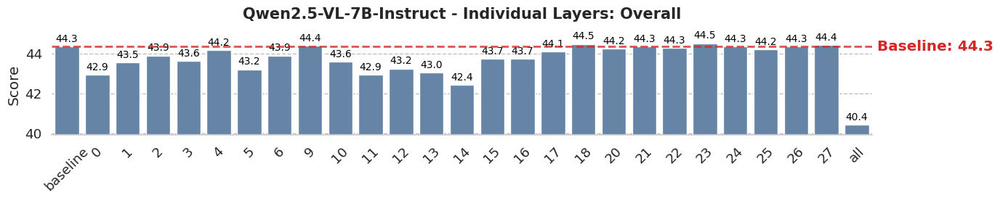

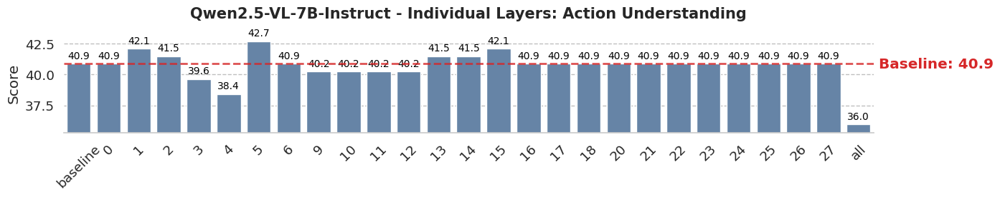

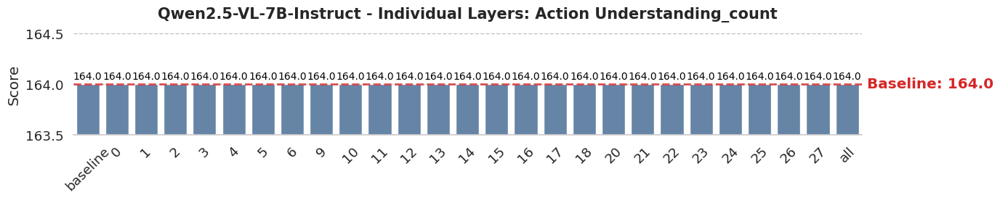

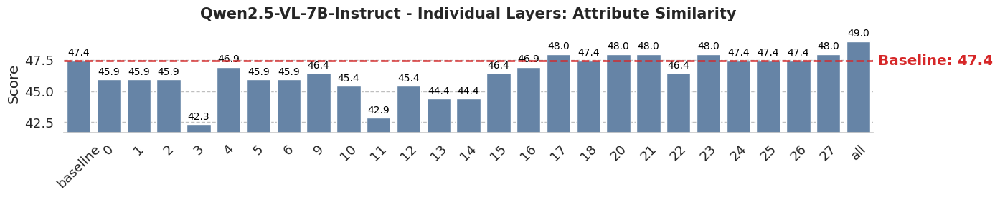

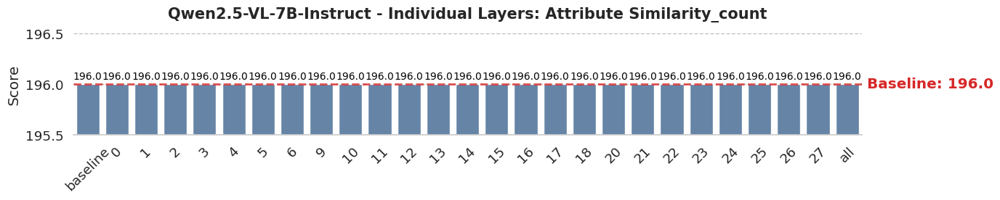

...

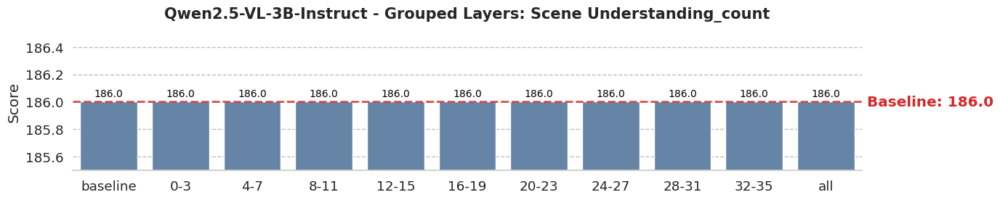

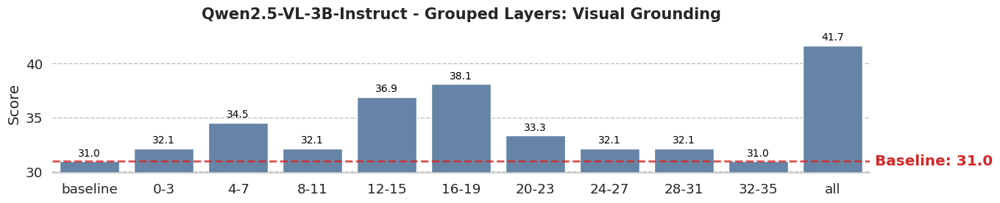

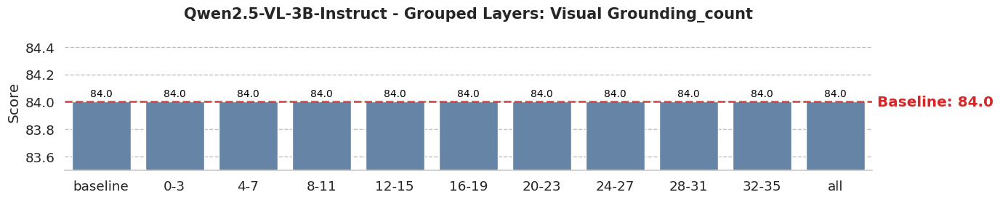

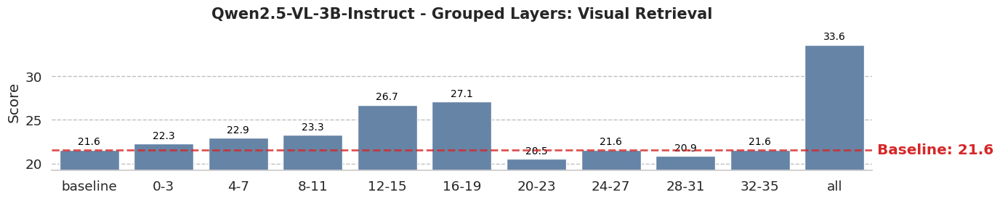

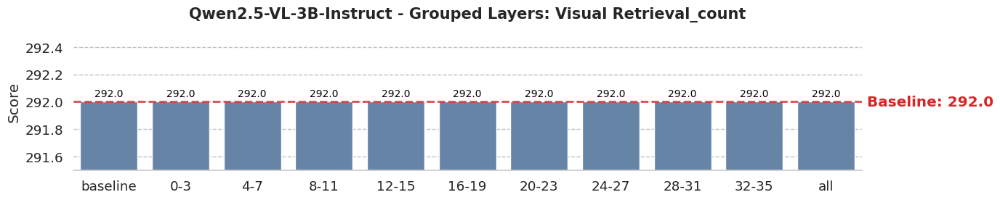

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ==========================================
# MUIRBENCH PLOTTING (Per Subtask)
# ==========================================

# 1. Prepare Dataframe from the gathered rows
if muir_rows:
    df_muir = pd.DataFrame(muir_rows)
else:
    df_muir = pd.DataFrame()

if not df_muir.empty:

    # --- Configuration ---
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.2)
    
    # Identify all subtask columns (excluding metadata)
    meta_cols = ['Model', 'Masked Layers']
    subtasks = [c for c in df_muir.columns if c not in meta_cols]
    
    # Ensure 'Overall' is processed first if present
    if 'Overall' in subtasks:
        subtasks.remove('Overall')
        subtasks = ['Overall'] + sorted(subtasks)
    else:
        subtasks = sorted(subtasks)

    # --- Sorting Logic ---
    def get_sort_key(val):
        s_val = str(val).strip().lower()
        if 'baseline' in s_val: return (0, -1)   # Priority 0: Baseline
        if s_val == 'all': return (3, 999)       # Priority 3: All (Last)
        
        # Check for Range (e.g. "0-3")
        if '-' in s_val:
            try:
                start = int(s_val.split('-')[0])
                return (2, start)                # Priority 2: Ranges
            except: pass
            
        # Check for Single Integer (e.g. "0")
        if s_val.isdigit():
            return (1, int(s_val))               # Priority 1: Singles
            
        return (4, 0)

    df_muir['sort_key'] = df_muir['Masked Layers'].apply(get_sort_key)

    # --- Plotting Loop ---
    unique_models = df_muir['Model'].unique()

    for model in unique_models:
        model_df = df_muir[df_muir['Model'] == model].copy()

        # Create two subsets
        # 1. Individual Layers: Baseline + Singles (Priority 1) + All
        mask_singles = model_df['sort_key'].apply(lambda x: x[0] in [0, 1, 3])
        df_singles = model_df[mask_singles].sort_values('sort_key')

        # 2. Grouped Layers: Baseline + Ranges (Priority 2) + All
        mask_ranges = model_df['sort_key'].apply(lambda x: x[0] in [0, 2, 3])
        df_ranges = model_df[mask_ranges].sort_values('sort_key')

        datasets = [
            (df_singles, "Individual Layers"),
            (df_ranges, "Grouped Layers")
        ]

        for data, subtitle in datasets:
            # Skip if insufficient data (e.g. only baseline available)
            if len(data) <= 1: continue

            # Create a SEPARATE figure for each subtask
            for task in subtasks:
                
                # Check if this task actually has data for this model (ignore all-NaN columns)
                if data[task].isna().all():
                    continue

                plt.figure(figsize=(14, 3))
                
                # 1. Extract Baseline Value
                baseline_row = data[data['Masked Layers'].astype(str).str.contains('Baseline', case=False)]
                baseline_val = baseline_row[task].values[0] if not baseline_row.empty else None

                # 2. Draw Bar Chart
                ax = sns.barplot(
                    data=data,
                    x='Masked Layers',
                    y=task,
                    color='#5b84b1',  # Clean blue
                    edgecolor=None
                )

                # 3. Add Horizontal Baseline Line
                if baseline_val is not None and not np.isnan(baseline_val):
                    plt.axhline(y=baseline_val, color='#d62728', linestyle='--', linewidth=2, alpha=0.8, zorder=5)
                    plt.text(x=len(data)-0.5, y=baseline_val, s=f' Baseline: {baseline_val:.1f}', 
                             color='#d62728', va='center', ha='left', fontweight='bold')
                ax.bar_label(ax.containers[0], fmt='%.1f', padding=3, fontsize=10, color='black')
                # 4. Smart Y-Axis Limits (Zoom in)
                y_values = data[task].dropna().values
                if len(y_values) > 0:
                    y_min = y_values.min()
                    y_max = y_values.max()
                    
                    if baseline_val is not None and not np.isnan(baseline_val):
                        y_min = min(y_min, baseline_val)
                        y_max = max(y_max, baseline_val)
                    
                    y_range = y_max - y_min
                    # Add margin: 10% of range, or minimal 0.5 if range is tiny
                    margin = max(y_range * 0.1, 0.5)
                    
                    # Ensure we don't go below 0
                    lower_lim = max(0, y_min - margin)
                    upper_lim = y_max + margin
                    
                    plt.ylim(lower_lim, upper_lim)

                # 5. Styling
                model_name = model.split("__")[1]
                plt.title(f"{model_name} - {subtitle}: {task}", fontsize=15, fontweight='bold', pad=15)
                plt.xlabel('')
                plt.ylabel('Score')
                sns.despine(left=True)
                plt.grid(axis='y', linestyle='--', alpha=0.5, color='gray')
                plt.grid(axis='x', visible=False)
                
                # Rotate labels for individual layers to prevent overlap
                if 'Individual' in subtitle:
                    plt.xticks(rotation=45)

                plt.tight_layout()
                plt.show()
else:
    print("No MuirBench data found to plot.")

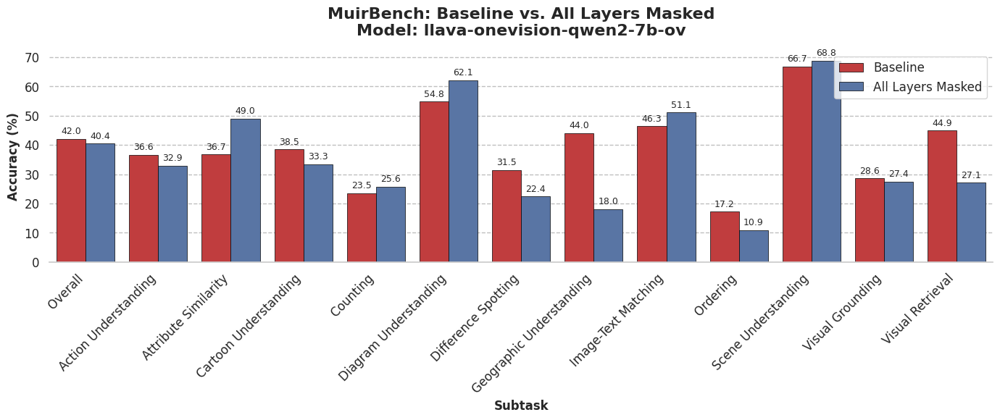

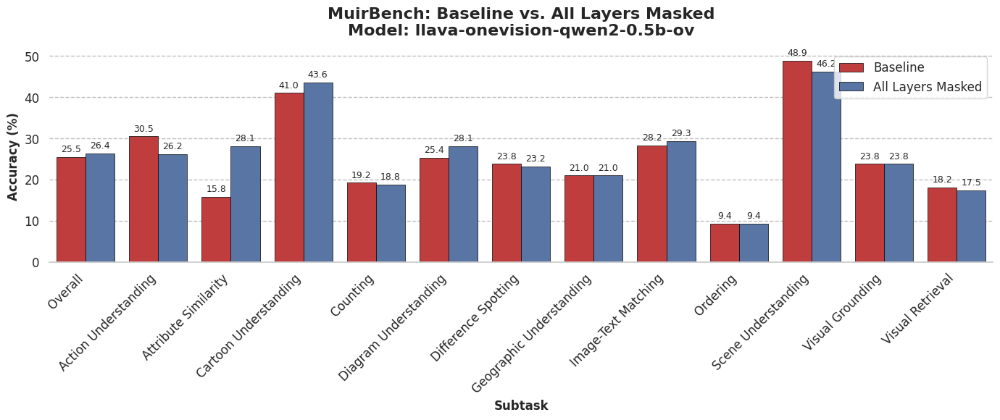

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ==========================================
# MUIRBENCH: BASELINE vs ALL (Grouped Bar Plot)
# ==========================================

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ==========================================
# MUIRBENCH PLOTTING (Per Subtask)
# ==========================================

# 1. Prepare Dataframe from the gathered rows
if muir_rows:
    df_muir = pd.DataFrame(muir_rows)
else:
    df_muir = pd.DataFrame()

if not df_muir.empty:
    
    # Filter for only 'Baseline' and 'All' configurations
    # We use string matching to be safe (e.g., "baseline" vs "Baseline")
    mask = df_muir['Masked Layers'].astype(str).str.lower().isin(['baseline', 'all'])
    df_filtered = df_muir[mask].copy()

    # Standardize names for the legend
    df_filtered['Configuration'] = df_filtered['Masked Layers'].apply(
        lambda x: 'Baseline' if 'baseline' in str(x).lower() else 'All Layers Masked'
    )

    # 2. Reshape (Melt) Data for Plotting
    # Converts columns [Overall, Task A, Task B...] into rows under column "Task"
    meta_cols = ['Model', 'Masked Layers', 'Configuration', 'sort_key']
    value_vars = [c for c in df_filtered.columns if c not in meta_cols]
    
    # Melt
    df_long = df_filtered.melt(
        id_vars=['Model', 'Configuration'], 
        value_vars=value_vars, 
        var_name='Task', 
        value_name='Score'
    )

    # 3. Plotting Loop
    unique_models = df_long['Model'].unique()
    
    # clean style
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.1)

    for model in unique_models:
        model_data = df_long[df_long['Model'] == model].copy()
        
        # Sort tasks: Overall first, then alphabetical
        tasks = sorted(model_data['Task'].unique())
        if 'Overall' in tasks:
            tasks.remove('Overall')
            tasks = ['Overall'] + tasks
            
        # Define order for the hue (bars)
        hue_order = ['Baseline', 'All Layers Masked']

        # Create Figure
        plt.figure(figsize=(14, 6))
        
        # Draw Grouped Bar Chart
        ax = sns.barplot(
            data=model_data,
            x='Task',
            y='Score',
            hue='Configuration',
            hue_order=hue_order,
            order=tasks,
            palette=['#d62728', '#4c72b0'],  # Red for Baseline, Blue for All
            edgecolor='black',
            linewidth=0.5
        )

        # Styling
        clean_model_name = model.split("__")[1] if "__" in model else model
        plt.title(f"MuirBench: Baseline vs. All Layers Masked\nModel: {clean_model_name}", 
                  fontsize=16, fontweight='bold', pad=15)
        plt.xlabel('Subtask', fontsize=12, fontweight='bold')
        plt.ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title=None, loc='upper right', frameon=True)
        
        # Despine and Grid
        sns.despine(left=True)
        ax.yaxis.grid(True, linestyle='--', alpha=0.5, color='gray')
        ax.xaxis.grid(False)

        # Add values on top of bars
        for container in ax.containers:
            ax.bar_label(container, fmt='%.1f', fontsize=9, padding=3)
            
        # Adjust layout
        plt.tight_layout()
        plt.show()

else:
    print("No MuirBench data available (df_muir is empty or missing).")

In [21]:
# ==========================================
# MUIRBENCH: PRINT COMPARISON (Baseline vs All)
# ==========================================

if 'df_muir' in locals() and not df_muir.empty:
    
    # 1. Identify MuirBench Task Columns
    # Exclude metadata columns
    exclude_cols = ['Model', 'Masked Layers', 'Configuration', 'sort_key']
    muir_task_cols = [c for c in df_muir.columns if c not in exclude_cols]
    
    print("\n" + "="*60)
    print("MUIRBENCH DETAILED COMPARISON: Baseline vs. All Layers Masked")
    print("="*60)

    unique_models = df_muir['Model'].unique()

    for model in unique_models:
        clean_model_name = model.split("__")[1] if "__" in model else model
        print(f"\nModel: {clean_model_name}")
        print("-" * 30)
        
        # Extract rows
        base_row = df_muir[(df_muir['Model'] == model) & (df_muir['Masked Layers'].astype(str).str.lower().str.contains('baseline'))]
        all_row = df_muir[(df_muir['Model'] == model) & (df_muir['Masked Layers'].astype(str).str.lower() == 'all')]
        
        if base_row.empty or all_row.empty:
            print("  [!] Missing 'Baseline' or 'All' data for this model.")
            continue
            
        better_than_all = []
        worse_than_all = []
        
        for task in muir_task_cols:
            # Get values safely
            try:
                b_val = base_row[task].values[0]
                a_val = all_row[task].values[0]
                
                # Skip if NaN
                if pd.isna(b_val) or pd.isna(a_val):
                    continue
                
                diff = b_val - a_val
                
                # Categorize
                if diff > 0:
                    # Baseline is Better
                    better_than_all.append((task, b_val, a_val, diff))
                elif diff < 0:
                    # Baseline is Worse (All is Better)
                    worse_than_all.append((task, b_val, a_val, abs(diff)))
                    
            except IndexError:
                continue

        # --- PRINT RESULTS ---
        
        # 1. Baseline Better
        print(f"  [Baseline > All] (Baseline is better in {len(better_than_all)} tasks):")
        if better_than_all:
            # Sort by difference descending (largest gap first)
            better_than_all.sort(key=lambda x: x[3], reverse=True)
            for t, b, a, d in better_than_all:
                print(f"    • {t:<30} : {b:.1f} vs {a:.1f} (Diff: +{d:.1f})")
        else:
            print("    None")
            
        print("")

        # 2. Baseline Worse
        print(f"  [Baseline < All] (Baseline is worse in {len(worse_than_all)} tasks):")
        if worse_than_all:
            # Sort by difference descending
            worse_than_all.sort(key=lambda x: x[3], reverse=True)
            for t, b, a, d in worse_than_all:
                print(f"    • {t:<30} : {b:.1f} vs {a:.1f} (Diff: -{d:.1f})")
        else:
            print("    None")
            
        print("-" * 60)
else:
    print("No MuirBench data available.")


MUIRBENCH DETAILED COMPARISON: Baseline vs. All Layers Masked

Model: llava-onevision-qwen2-7b-ov
------------------------------
  [Baseline > All] (Baseline is better in 8 tasks):
    • Geographic Understanding       : 44.0 vs 18.0 (Diff: +26.0)
    • Visual Retrieval               : 44.9 vs 27.1 (Diff: +17.8)
    • Difference Spotting            : 31.5 vs 22.4 (Diff: +9.1)
    • Ordering                       : 17.2 vs 10.9 (Diff: +6.2)
    • Cartoon Understanding          : 38.5 vs 33.3 (Diff: +5.1)
    • Action Understanding           : 36.6 vs 32.9 (Diff: +3.7)
    • Overall                        : 42.0 vs 40.4 (Diff: +1.5)
    • Visual Grounding               : 28.6 vs 27.4 (Diff: +1.2)

  [Baseline < All] (Baseline is worse in 5 tasks):
    • Attribute Similarity           : 36.7 vs 49.0 (Diff: -12.2)
    • Diagram Understanding          : 54.8 vs 62.1 (Diff: -7.3)
    • Image-Text Matching            : 46.3 vs 51.1 (Diff: -4.7)
    • Scene Understanding            : 66.7 vs 6

In [22]:
import json
import glob
import os
import pandas as pd

# ==========================================
# 1. CONFIGURATION
# ==========================================

LOG_DIRECTORIES ="/lustre/groups/eml/projects/huang/multi_image/lmms-eval/logs/llava-ov-mask-attention"

# ==========================================
# 2. EVALUATION LOGIC (MMMU / MIRB Style)
# ==========================================

def normalize_str(s):
    """
    Approximation of MMMU normalize_str.
    Returns a list containing the normalized value (float or string).
    """
    if s is None:
        return []
    
    # Try converting to float first
    try:
        return [float(s)]
    except ValueError:
        pass
    
    # Otherwise normalize string
    if isinstance(s, str):
        return [s.strip().lower()]
    return [str(s)]

def eval_multi_choice(gold_i, pred_i):
    """
    Evaluate a multiple choice instance.
    https://github.com/MMMU-Benchmark/MMMU/blob/51ce7f3e829c16bb44bc5445782686b4c3508794/eval/eval_utils.py#L175
    """
    correct = False
    # only they are exactly the same, we consider it as correct
    if isinstance(gold_i, list):
        for answer in gold_i:
            if answer == pred_i:
                correct = True
                break
    else:  # gold_i is a string
        if gold_i == pred_i:
            correct = True
    return correct


def eval_open(gold_i, pred_i):
    """
    Evaluate an open question instance
    https://github.com/MMMU-Benchmark/MMMU/blob/51ce7f3e829c16bb44bc5445782686b4c3508794/eval/eval_utils.py#L191
    """
    correct = False
    if isinstance(gold_i, list):
        # use float to avoid trivial matches
        norm_answers = []
        for answer in gold_i:
            norm_answers.extend(normalize_str(answer))
    else:
        norm_answers = normalize_str(gold_i)
    for pred in pred_i:  # pred is already normalized in parse response phase
        if isinstance(pred, str):  # if it's a string, then find if ans in the pred_i
            for norm_ans in norm_answers:
                # only see if the string answer in the string pred
                if isinstance(norm_ans, str) and norm_ans in pred:
                    if not correct:
                        correct = True
                    break
        else:  # it's a float number
            if pred in norm_answers:
                if not correct:
                    correct = True
                break
    return correct

def parse_mirb_advanced(file_path):
    stats = {}
    total_correct = 0
    total_count = 0
    
    try:
        with open(file_path, 'r') as f:
            for line in f:
                entry = json.loads(line)
                info = entry.get('mirb_score', {})
                if not info: continue
                
                subset = info.get('subset', 'Unknown')
                pred_answer = info.get('pred_answer', [])
                answers = info.get('answers', '')
                
                # --- DETERMINE EVALUATION METHOD ---
                # Logic: If answer is single letter A-E, treat as MCQ
                is_mcq = False
                if isinstance(answers, str) and answers.strip().upper() in ["A", "B", "C", "D", "E"]:
                    is_mcq = True
                
                # --- EVALUATE ---
                if is_mcq:
                    is_correct = eval_multi_choice(answers, pred_answer)
                else:
                    is_correct = eval_open(answers, pred_answer)
                
                # --- UPDATE STATS ---
                if subset not in stats: stats[subset] = {'c': 0, 't': 0}
                stats[subset]['t'] += 1
                if is_correct: stats[subset]['c'] += 1
                
                total_count += 1
                if is_correct: total_correct += 1
                
    except Exception as e:
        print(f"Error parsing {file_path}: {e}")
        return None
        
    # Calculate Percentages
    results = {k: (v['c'] / v['t'] * 100) for k, v in stats.items()}
    results['Overall'] = (total_correct / total_count * 100) if total_count > 0 else 0.0
    
    return results

# ==========================================
# 3. MAIN EXECUTION
# ==========================================

mirb_rows = []

results_files = glob.glob(os.path.join(LOG_DIRECTORIES, "**", "*_results.json"), recursive=True)
    
for res_file in results_files:
    dir_name = os.path.dirname(res_file)
    base_name = os.path.basename(res_file).replace('_results.json', '')
    
    try:
        with open(res_file, 'r') as f:
            meta = json.load(f)
            model_name = meta.get('model_name_sanitized', meta.get('model_name', 'Unknown'))
    except:
        continue
        
    # Process MIRB with Advanced Logic
    mirb_path = os.path.join(dir_name, f"{base_name}_samples_mirb.jsonl")
    layer = mirb_path.split("/")[-3].split("-mask-attention-")[-1]
    if os.path.exists(mirb_path):
        scores = parse_mirb_advanced(mirb_path)
        if scores:
            row = {'Model': model_name, 'Masked Layers': layer}
            row.update(scores)
            mirb_rows.append(row)

# ==========================================
# 4. DISPLAY TABLE
# ==========================================

if mirb_rows:
    df_mirb = pd.DataFrame(mirb_rows)
    
    # Sort Rows
    df_mirb = df_mirb.sort_values(by=['Model', 'Masked Layers']).reset_index(drop=True)
    
    # Sort Columns (Overall first, then alphabetical)
    meta = ['Model', 'Masked Layers']
    others = [c for c in df_mirb.columns if c not in meta]
    
    if 'Overall' in others:
        others.remove('Overall')
        cols = meta + ['Overall'] + sorted(others)
    else:
        cols = meta + sorted(others)
        
    print("\n### 4. MIRB Subset Breakdown (Corrected Evaluation)")
    display(
        df_mirb[cols].style.format(precision=1, na_rep="-")
        .background_gradient(cmap='Blues', subset=cols[2:])
        .set_properties(**{'text-align': 'center'})
    )
else:
    print("No MIRB data found.")


### 4. MIRB Subset Breakdown (Corrected Evaluation)


,Model,Masked Layers,Overall,3d_scene,analogy,arxiv,attribute,codeu,count,food,image_jigsaw,plot_code,sightseeing,visual_chain
0,lmms-lab__llava-onevision-qwen2-0.5b-ov,0,34.7,0.0,43.0,0.0,50.0,50.0,43.3,39.0,29.0,20.5,72.5,0.0
1,lmms-lab__llava-onevision-qwen2-0.5b-ov,0-3,35.1,0.0,46.0,0.0,49.0,50.0,42.7,39.0,29.0,22.7,74.5,0.0
2,lmms-lab__llava-onevision-qwen2-0.5b-ov,1,35.0,0.0,44.0,0.0,49.0,50.0,42.7,40.0,30.0,22.7,73.5,0.0
3,lmms-lab__llava-onevision-qwen2-0.5b-ov,10,35.1,0.0,45.0,0.0,50.0,50.0,43.3,40.0,30.0,20.5,72.5,0.0
4,lmms-lab__llava-onevision-qwen2-0.5b-ov,11,35.0,0.0,45.0,0.0,49.0,50.0,43.3,39.0,30.0,22.7,72.5,0.0
5,lmms-lab__llava-onevision-qwen2-0.5b-ov,12,34.7,0.0,41.0,0.0,50.0,50.0,43.3,39.0,30.0,22.7,72.5,0.0
6,lmms-lab__llava-onevision-qwen2-0.5b-ov,12-15,34.8,0.0,42.0,0.0,49.0,50.0,43.3,40.0,30.0,22.7,72.5,0.0
7,lmms-lab__llava-onevision-qwen2-0.5b-ov,13,34.6,0.0,44.0,0.0,48.0,50.0,43.3,39.0,29.0,20.5,72.5,0.0
8,lmms-lab__llava-onevision-qwen2-0.5b-ov,14,34.7,0.0,43.0,0.0,50.0,50.0,43.3,39.0,29.0,20.5,72.5,0.0
9,lmms-lab__llava-onevision-qwen2-0.5b-ov,15,34.5,0.0,42.0,0.0,48.0,50.0,43.3,39.0,30.0,20.5,72.5,0.0


Plotting the following MIRB tasks: ['Overall', '3d_scene', 'analogy', 'arxiv', 'attribute', 'codeu', 'count', 'food', 'image_jigsaw', 'plot_code', 'sightseeing', 'visual_chain']


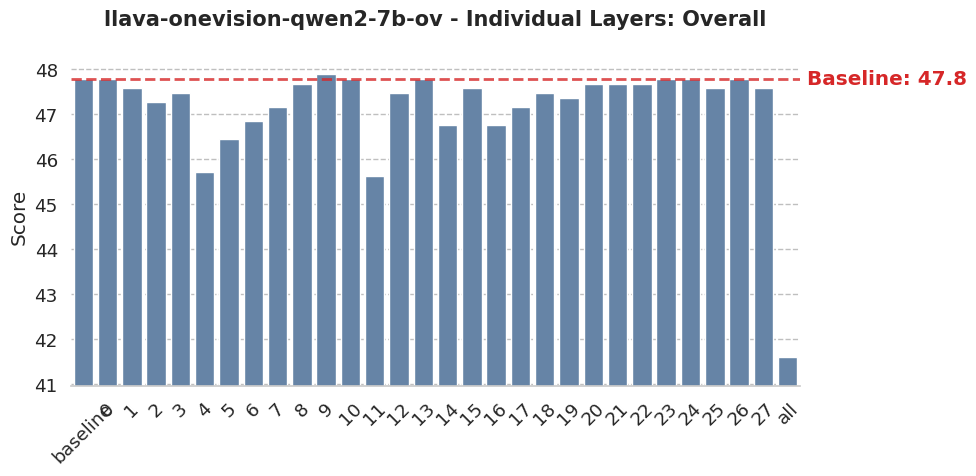

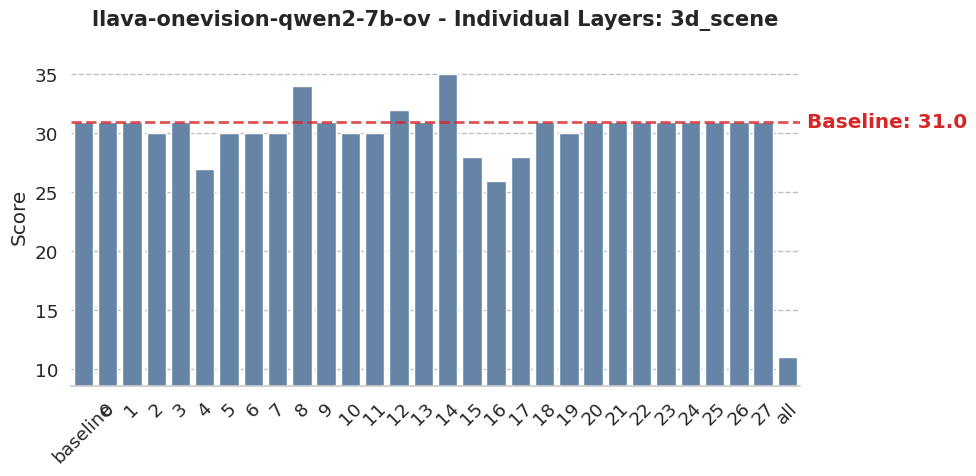

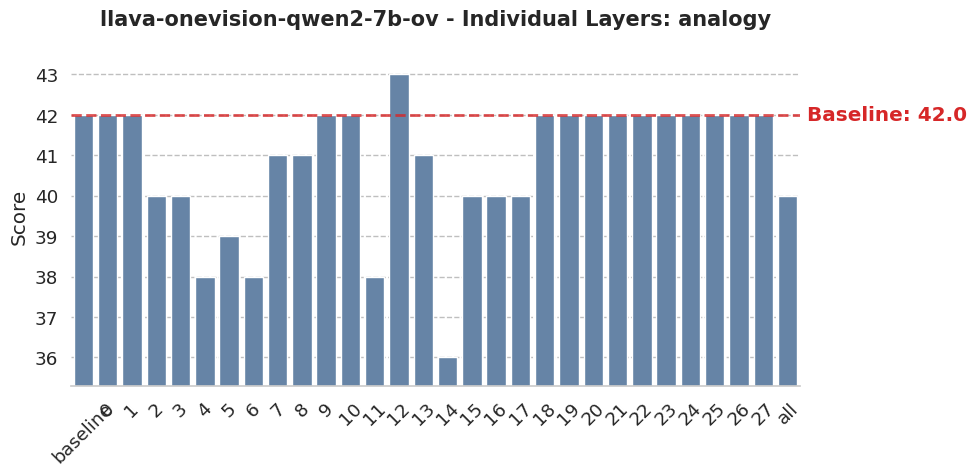

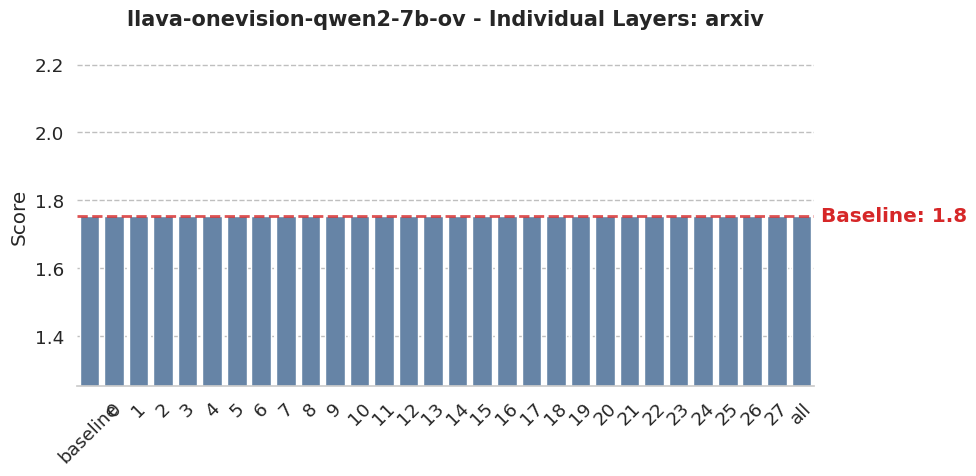

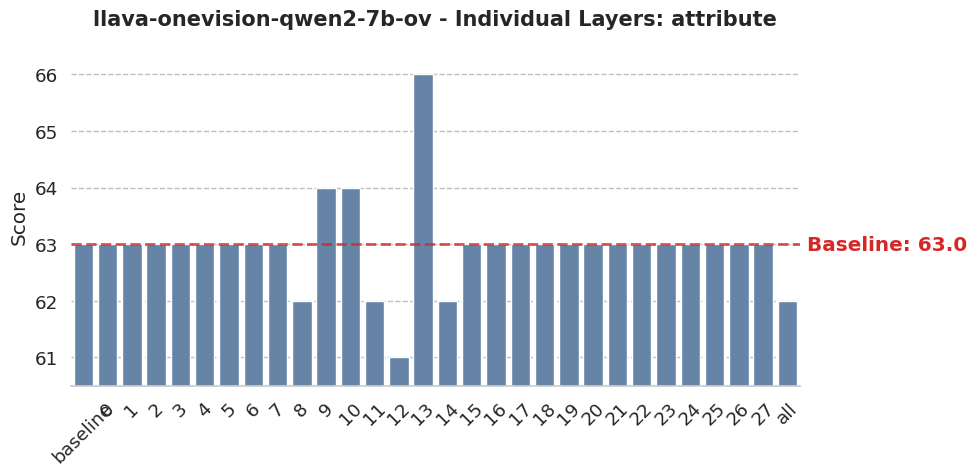

...

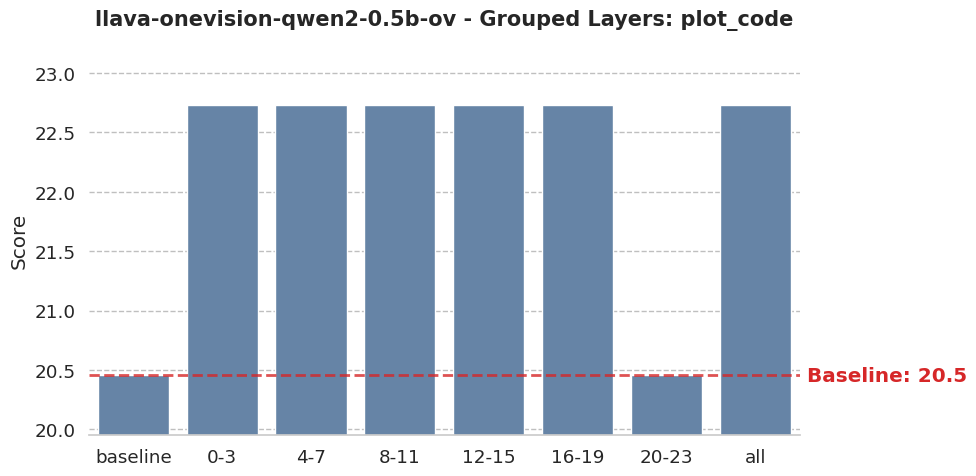

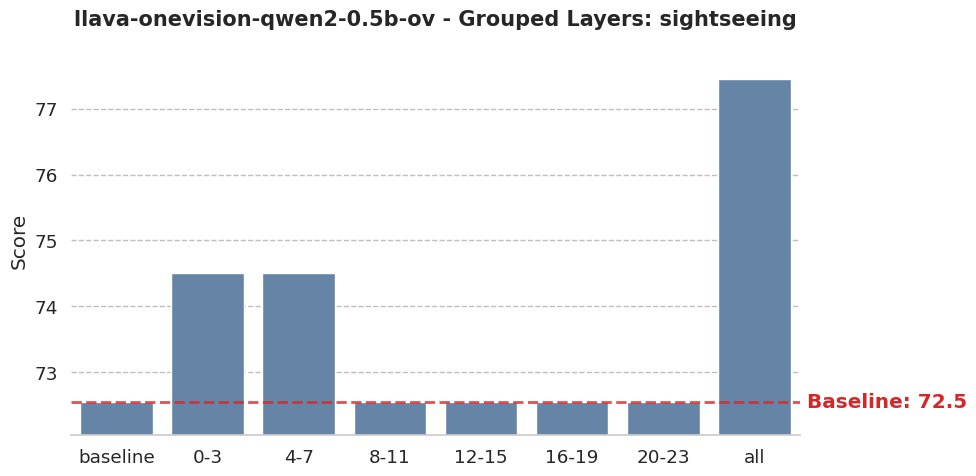

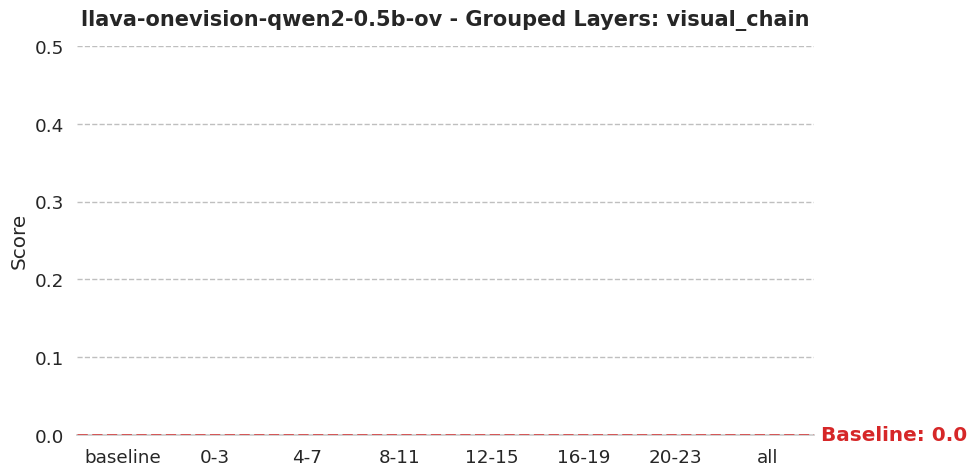

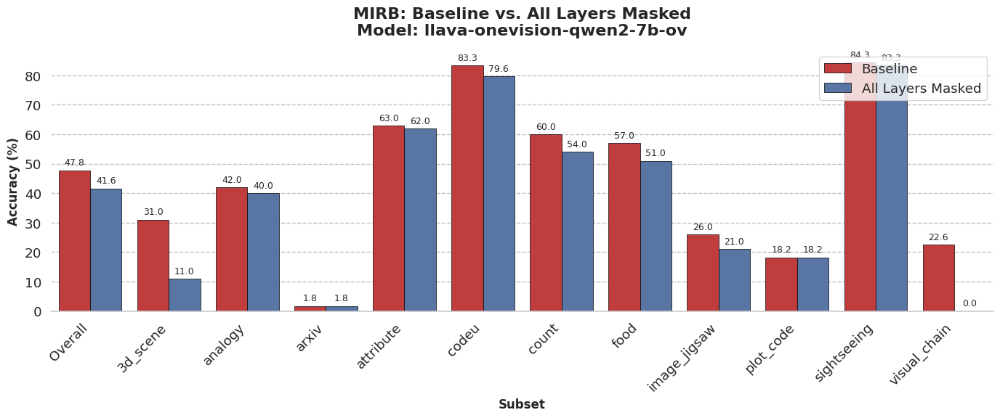

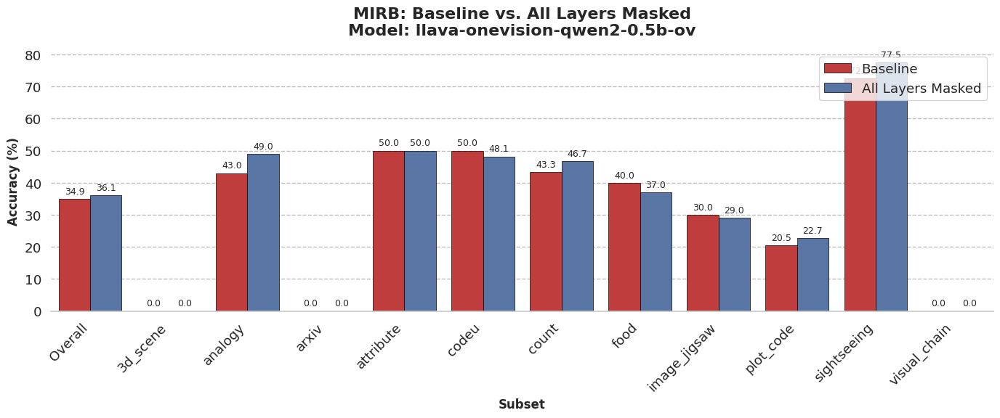

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ==========================================
# MIRB PLOTTING (Per Subtask)
# ==========================================

# 1. Prepare Dataframe
if 'mirb_rows' in locals() and mirb_rows:
    df_mirb = pd.DataFrame(mirb_rows)
else:
    df_mirb = pd.DataFrame()

if not df_mirb.empty:

    # --- Configuration ---
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.2)
    
    # Identify subtask columns (excluding metadata)
    meta_cols = ['Model', 'Masked Layers']
    # Filter out columns that are not scores
    subtasks = [c for c in df_mirb.columns if c not in meta_cols]
    
    # Ensure 'Overall' is processed first if present
    if 'Overall' in subtasks:
        subtasks.remove('Overall')
        subtasks = ['Overall'] + sorted(subtasks)
    else:
        subtasks = sorted(subtasks)

    print(f"Plotting the following MIRB tasks: {subtasks}")

    # --- Sorting Logic ---
    def get_sort_key(val):
        s_val = str(val).strip().lower()
        if 'baseline' in s_val: return (0, -1)   # Priority 0: Baseline
        if s_val == 'all': return (3, 999)       # Priority 3: All (Last)
        
        # Check for Range (e.g. "0-3")
        if '-' in s_val:
            try:
                start = int(s_val.split('-')[0])
                return (2, start)                # Priority 2: Ranges
            except: pass
            
        # Check for Single Integer (e.g. "0")
        if s_val.isdigit():
            return (1, int(s_val))               # Priority 1: Singles
            
        return (4, 0)

    df_mirb['sort_key'] = df_mirb['Masked Layers'].apply(get_sort_key)

    # --- Plotting Loop ---
    unique_models = df_mirb['Model'].unique()

    for model in unique_models:
        model_df = df_mirb[df_mirb['Model'] == model].copy()

        # Create two subsets
        # 1. Individual Layers
        mask_singles = model_df['sort_key'].apply(lambda x: x[0] in [0, 1, 3])
        df_singles = model_df[mask_singles].sort_values('sort_key')

        # 2. Grouped Layers
        mask_ranges = model_df['sort_key'].apply(lambda x: x[0] in [0, 2, 3])
        df_ranges = model_df[mask_ranges].sort_values('sort_key')

        datasets = [
            (df_singles, "Individual Layers"),
            (df_ranges, "Grouped Layers")
        ]

        for data, subtitle in datasets:
            if len(data) <= 1: continue

            # Iterate through each MIRB subtask
            for task in subtasks:
                
                # Skip if column is all NaN
                if data[task].isna().all():
                    continue

                plt.figure(figsize=(10, 5))
                
                # 1. Extract Baseline Value
                baseline_row = data[data['Masked Layers'].astype(str).str.contains('Baseline', case=False)]
                baseline_val = baseline_row[task].values[0] if not baseline_row.empty else None

                # 2. Draw Bar Chart
                ax = sns.barplot(
                    data=data,
                    x='Masked Layers',
                    y=task,
                    color='#5b84b1',  # Clean blue
                    edgecolor=None
                )

                # 3. Add Horizontal Baseline Line
                if baseline_val is not None and not np.isnan(baseline_val):
                    plt.axhline(y=baseline_val, color='#d62728', linestyle='--', linewidth=2, alpha=0.8, zorder=5)
                    plt.text(x=len(data)-0.5, y=baseline_val, s=f' Baseline: {baseline_val:.1f}', 
                             color='#d62728', va='center', ha='left', fontweight='bold')

                # 4. Smart Y-Axis Limits (Zoom in)
                y_values = data[task].dropna().values
                if len(y_values) > 0:
                    y_min = y_values.min()
                    y_max = y_values.max()
                    
                    if baseline_val is not None and not np.isnan(baseline_val):
                        y_min = min(y_min, baseline_val)
                        y_max = max(y_max, baseline_val)
                    
                    y_range = y_max - y_min
                    # Minimum margin of 0.5 or 10% of range
                    margin = max(y_range * 0.1, 0.5)
                    
                    lower_lim = max(0, y_min - margin)
                    upper_lim = y_max + margin
                    
                    plt.ylim(lower_lim, upper_lim)

                # 5. Styling
                clean_model = model.split("__")[1] if "__" in model else model
                plt.title(f"{clean_model} - {subtitle}: {task}", fontsize=15, fontweight='bold', pad=15)
                plt.xlabel('')
                plt.ylabel('Score')
                sns.despine(left=True)
                plt.grid(axis='y', linestyle='--', alpha=0.5, color='gray')
                plt.grid(axis='x', visible=False)
                
                if 'Individual' in subtitle:
                    plt.xticks(rotation=45)

                plt.tight_layout()
                plt.show()

    # ==========================================
    # MIRB: BASELINE vs ALL (Comparison Plot)
    # ==========================================
    
    # Filter for 'Baseline' and 'All'
    mask = df_mirb['Masked Layers'].astype(str).str.lower().isin(['baseline', 'all'])
    df_filtered = df_mirb[mask].copy()

    if not df_filtered.empty:
        df_filtered['Configuration'] = df_filtered['Masked Layers'].apply(
            lambda x: 'Baseline' if 'baseline' in str(x).lower() else 'All Layers Masked'
        )

        # Melt Data
        meta_cols = ['Model', 'Masked Layers', 'Configuration', 'sort_key']
        value_vars = [c for c in df_filtered.columns if c not in meta_cols]
        
        df_long = df_filtered.melt(
            id_vars=['Model', 'Configuration'], 
            value_vars=value_vars, 
            var_name='Task', 
            value_name='Score'
        )

        unique_models = df_long['Model'].unique()
        
        for model in unique_models:
            model_data = df_long[df_long['Model'] == model].copy()
            
            # Sort tasks
            tasks = sorted(model_data['Task'].unique())
            if 'Overall' in tasks:
                tasks.remove('Overall')
                tasks = ['Overall'] + tasks
                
            plt.figure(figsize=(14, 6))
            
            ax = sns.barplot(
                data=model_data,
                x='Task',
                y='Score',
                hue='Configuration',
                hue_order=['Baseline', 'All Layers Masked'],
                order=tasks,
                palette=['#d62728', '#4c72b0'],
                edgecolor='black',
                linewidth=0.5
            )

            clean_model = model.split("__")[1] if "__" in model else model
            plt.title(f"MIRB: Baseline vs. All Layers Masked\nModel: {clean_model}", 
                      fontsize=16, fontweight='bold', pad=15)
            plt.xlabel('Subset', fontsize=12, fontweight='bold')
            plt.ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
            plt.xticks(rotation=45, ha='right')
            plt.legend(title=None, loc='upper right')
            
            sns.despine(left=True)
            ax.yaxis.grid(True, linestyle='--', alpha=0.5, color='gray')
            ax.xaxis.grid(False)

            for container in ax.containers:
                ax.bar_label(container, fmt='%.1f', fontsize=9, padding=3)
                
            plt.tight_layout()
            plt.show()

else:
    print("No MIRB data available.")

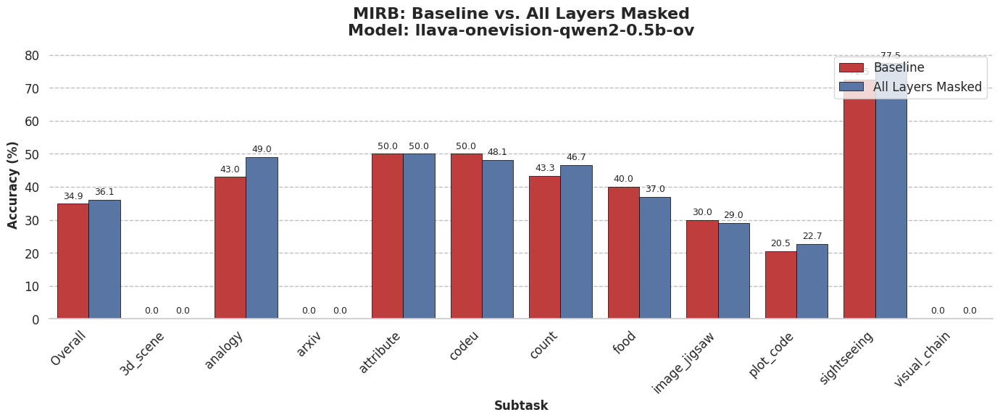

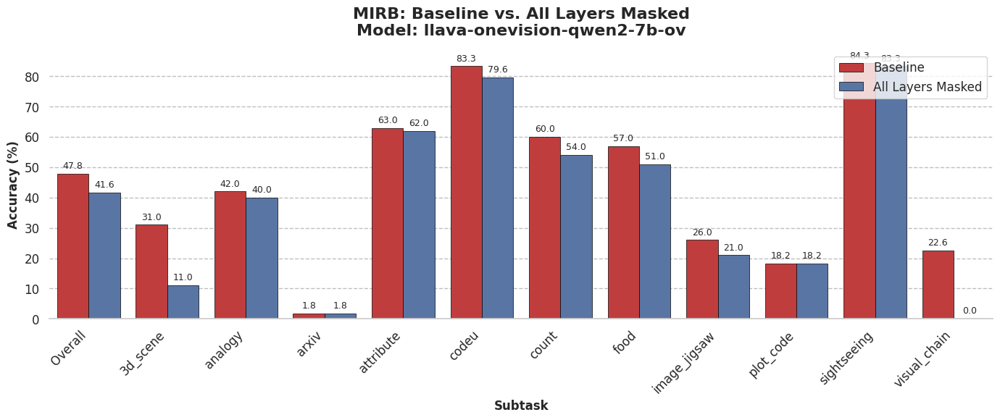

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ==========================================
# MIRB: BASELINE vs ALL (Grouped Bar Plot)
# ==========================================

# 1. Prepare Data
if 'df_mirb' in locals() and not df_mirb.empty:
    
    # Filter for only 'Baseline' and 'All' configurations
    # We use string matching to be safe (case-insensitive)
    mask = df_mirb['Masked Layers'].astype(str).str.lower().isin(['baseline', 'all'])
    df_filtered = df_mirb[mask].copy()

    # Create a clean 'Configuration' column for the legend
    df_filtered['Configuration'] = df_filtered['Masked Layers'].apply(
        lambda x: 'Baseline' if 'baseline' in str(x).lower() else 'All Layers Masked'
    )

    # 2. Reshape (Melt) Data for Plotting
    # Identify subtask columns (all cols except metadata)
    meta_cols = ['Model', 'Masked Layers', 'Configuration', 'sort_key']
    value_vars = [c for c in df_filtered.columns if c not in meta_cols]
    
    # Melt into long format
    df_long = df_filtered.melt(
        id_vars=['Model', 'Configuration'], 
        value_vars=value_vars, 
        var_name='Task', 
        value_name='Score'
    )

    # 3. Plotting Loop
    unique_models = df_long['Model'].unique()
    
    # Set style
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.1)

    for model in unique_models:
        model_data = df_long[df_long['Model'] == model].copy()
        
        # Sort tasks: Force 'Overall' to be first, then alphabetical for the rest
        tasks = sorted(model_data['Task'].unique())
        if 'Overall' in tasks:
            tasks.remove('Overall')
            tasks = ['Overall'] + tasks
            
        # Define order for the hue (bars)
        hue_order = ['Baseline', 'All Layers Masked']

        # Create Figure
        plt.figure(figsize=(14, 6))
        
        # Draw Grouped Bar Chart
        ax = sns.barplot(
            data=model_data,
            x='Task',
            y='Score',
            hue='Configuration',
            hue_order=hue_order,
            order=tasks,
            palette=['#d62728', '#4c72b0'],  # Red for Baseline, Blue for All
            edgecolor='black',
            linewidth=0.5
        )

        # Styling
        clean_model_name = model.split("__")[1] if "__" in model else model
        plt.title(f"MIRB: Baseline vs. All Layers Masked\nModel: {clean_model_name}", 
                  fontsize=16, fontweight='bold', pad=15)
        plt.xlabel('Subtask', fontsize=12, fontweight='bold')
        plt.ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title=None, loc='upper right', frameon=True)
        
        # Despine and Grid
        sns.despine(left=True)
        ax.yaxis.grid(True, linestyle='--', alpha=0.5, color='gray')
        ax.xaxis.grid(False)

        # Add values on top of bars
        for container in ax.containers:
            ax.bar_label(container, fmt='%.1f', fontsize=9, padding=3)
            
        # Adjust layout to prevent label cutoff
        plt.tight_layout()
        plt.show()

else:
    print("No MIRB data available (df_mirb is empty or missing).")

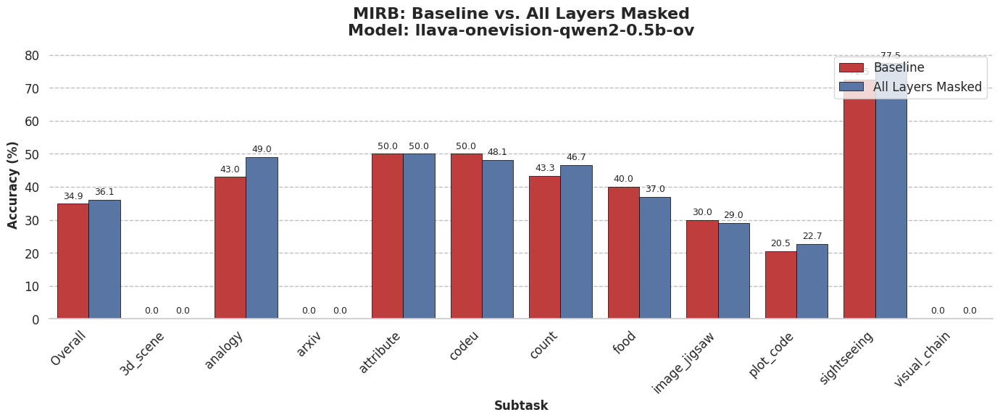

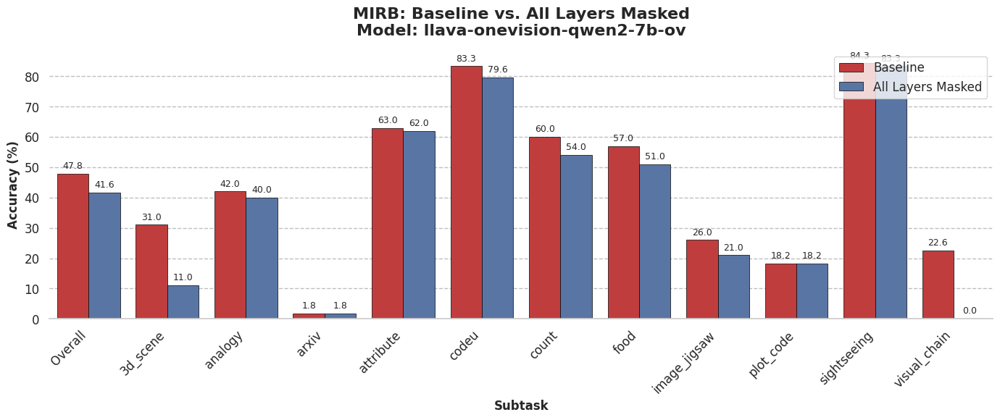


MIRB DETAILED COMPARISON: Baseline vs. All Layers Masked

Model: llava-onevision-qwen2-0.5b-ov
------------------------------
  [Baseline > All] (Baseline is better in 3 tasks):
    • food                           : 40.0 vs 37.0 (Diff: +3.0)
    • codeu                          : 50.0 vs 48.1 (Diff: +1.9)
    • image_jigsaw                   : 30.0 vs 29.0 (Diff: +1.0)

  [Baseline < All] (Baseline is worse in 5 tasks):
    • analogy                        : 43.0 vs 49.0 (Diff: -6.0)
    • sightseeing                    : 72.5 vs 77.5 (Diff: -4.9)
    • count                          : 43.3 vs 46.7 (Diff: -3.3)
    • plot_code                      : 20.5 vs 22.7 (Diff: -2.3)
    • Overall                        : 34.9 vs 36.1 (Diff: -1.2)
------------------------------------------------------------

Model: llava-onevision-qwen2-7b-ov
------------------------------
  [Baseline > All] (Baseline is better in 10 tasks):
    • visual_chain                   : 22.6 vs 0.0 (Diff: +22.6)
   

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import glob
import os
import json

# ==========================================
# 1. LOAD MIRB DATA (If not already loaded)
# ==========================================

mirb_rows = []
# Re-scan for MIRB files if df_mirb doesn't exist yet
if 'df_mirb' not in locals() or df_mirb.empty:
    search_pattern = os.path.join(LOG_DIRECTORIES, "**", "*_results.json")
    results_files = glob.glob(search_pattern, recursive=True)

    for res_file in results_files:
        dir_name = os.path.dirname(res_file)
        base_name = os.path.basename(res_file).replace('_results.json', '')
        
        try:
            with open(res_file, 'r') as f:
                meta = json.load(f)
                model_name = meta.get('model_name_sanitized', meta.get('model_name', 'Unknown'))
        except:
            continue
            
        # Construct MIRB path
        mirb_path = os.path.join(dir_name, f"{base_name}_samples_mirb.jsonl")
        layer = mirb_path.split("/")[-3].split("-mask-attention-")[-1]
        
        if os.path.exists(mirb_path):
            # Reuse your parse_mirb function
            scores = parse_mirb(mirb_path)
            if scores:
                row = {'Model': model_name, 'Masked Layers': layer}
                row.update(scores)
                mirb_rows.append(row)

    if mirb_rows:
        df_mirb = pd.DataFrame(mirb_rows)
    else:
        df_mirb = pd.DataFrame()

# ==========================================
# 2. PLOT: MIRB BASELINE vs ALL
# ==========================================

if not df_mirb.empty:
    
    # Filter for 'Baseline' and 'All'
    mask = df_mirb['Masked Layers'].astype(str).str.lower().isin(['baseline', 'all'])
    df_filtered = df_mirb[mask].copy()

    # Create 'Configuration' column for legend
    df_filtered['Configuration'] = df_filtered['Masked Layers'].apply(
        lambda x: 'Baseline' if 'baseline' in str(x).lower() else 'All Layers Masked'
    )

    # Reshape (Melt)
    meta_cols = ['Model', 'Masked Layers', 'Configuration']
    value_vars = [c for c in df_filtered.columns if c not in meta_cols]
    
    df_long = df_filtered.melt(
        id_vars=['Model', 'Configuration'], 
        value_vars=value_vars, 
        var_name='Task', 
        value_name='Score'
    )

    # Plotting Loop
    unique_models = df_long['Model'].unique()
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.1)

    for model in unique_models:
        model_data = df_long[df_long['Model'] == model].copy()
        
        # Sort tasks: 'Overall' first
        tasks = sorted(model_data['Task'].unique())
        if 'Overall' in tasks:
            tasks.remove('Overall')
            tasks = ['Overall'] + tasks
            
        plt.figure(figsize=(14, 6))
        
        ax = sns.barplot(
            data=model_data,
            x='Task',
            y='Score',
            hue='Configuration',
            hue_order=['Baseline', 'All Layers Masked'],
            order=tasks,
            palette=['#d62728', '#4c72b0'],  # Red vs Blue
            edgecolor='black',
            linewidth=0.5
        )

        clean_model_name = model.split("__")[1] if "__" in model else model
        plt.title(f"MIRB: Baseline vs. All Layers Masked\nModel: {clean_model_name}", 
                  fontsize=16, fontweight='bold', pad=15)
        plt.xlabel('Subtask', fontsize=12, fontweight='bold')
        plt.ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title=None, loc='upper right')
        
        sns.despine(left=True)
        ax.yaxis.grid(True, linestyle='--', alpha=0.5, color='gray')
        ax.xaxis.grid(False)

        for container in ax.containers:
            ax.bar_label(container, fmt='%.1f', fontsize=9, padding=3)
            
        plt.tight_layout()
        plt.show()

    # ==========================================
    # 3. PRINT DETAILED COMPARISON
    # ==========================================
    
    print("\n" + "="*60)
    print("MIRB DETAILED COMPARISON: Baseline vs. All Layers Masked")
    print("="*60)

    # Identify MIRB task columns (excluding metadata)
    exclude_cols = ['Model', 'Masked Layers', 'Configuration']
    mirb_task_cols = [c for c in df_mirb.columns if c not in exclude_cols]

    for model in unique_models:
        clean_model_name = model.split("__")[1] if "__" in model else model
        print(f"\nModel: {clean_model_name}")
        print("-" * 30)
        
        base_row = df_mirb[(df_mirb['Model'] == model) & (df_mirb['Masked Layers'].astype(str).str.lower().str.contains('baseline'))]
        all_row = df_mirb[(df_mirb['Model'] == model) & (df_mirb['Masked Layers'].astype(str).str.lower() == 'all')]
        
        if base_row.empty or all_row.empty:
            print("  [!] Missing 'Baseline' or 'All' data.")
            continue
            
        better_than_all = []
        worse_than_all = []
        
        for task in mirb_task_cols:
            try:
                b_val = base_row[task].values[0]
                a_val = all_row[task].values[0]
                
                if pd.isna(b_val) or pd.isna(a_val): continue
                
                diff = b_val - a_val
                
                if diff > 0:
                    better_than_all.append((task, b_val, a_val, diff))
                elif diff < 0:
                    worse_than_all.append((task, b_val, a_val, abs(diff)))
            except:
                continue

        # Print Better
        print(f"  [Baseline > All] (Baseline is better in {len(better_than_all)} tasks):")
        if better_than_all:
            better_than_all.sort(key=lambda x: x[3], reverse=True)
            for t, b, a, d in better_than_all:
                print(f"    • {t:<30} : {b:.1f} vs {a:.1f} (Diff: +{d:.1f})")
        else:
            print("    None")
            
        print("")

        # Print Worse
        print(f"  [Baseline < All] (Baseline is worse in {len(worse_than_all)} tasks):")
        if worse_than_all:
            worse_than_all.sort(key=lambda x: x[3], reverse=True)
            for t, b, a, d in worse_than_all:
                print(f"    • {t:<30} : {b:.1f} vs {a:.1f} (Diff: -{d:.1f})")
        else:
            print("    None")
            
        print("-" * 60)

else:
    print("No MIRB data available.")